<a href="https://colab.research.google.com/github/mondalso/HouseSalesInKingCountry/blob/main/KingCountyHousing_CompleteAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **House Sales in King County, USA**


# Abstract

A lot of consideration and study must go into the major choice of a person's life—buying a home. One wants to purchase a home at the best price with the least amount of risk and with the expectation that it will be the best investment going forward. Home buyers may compare several residences that are for sale thanks to a number of internet resources, real estate professionals, and realtors. In addition to assisting the consumer in choosing the ideal time to buy a home, house price prediction may assist the developer in determining the selling price of a home. Three elements, including a house's physical state, design, and location, all have an impact on its price. The aim of the Notebook is to predict the prices of houses in King County. The notebook has used statistical methods like p-value, t-statistics and visualization techniques like histogram, Q-Q plot, scatter plot, box-plot of python's matplotlib and seaborn library. The key variables that influence house prices are selected first.Then, the best model for prediction is selected. Linear Regression, Decision Tree, Random Forest, AutoML are some of the models explored before settling upon the best one. Then, the data is fitted to the selected model. After fitting the model, SHAP values are evaluated and interpretted. It may be concluded from the data analysis and test that the linear regression model can forecast and assess the housing price.

# Aim:
In this assignment we aim to create a complete ML project with

*   Checking Data Quality
*   Feature Selection
*   Modeling - Training Models, Selecting Best Model, Hyperparameter Tuning
*   Model Interpretibility
*   Reports and Visualizations







# Dataset

The data set consists of :

13 associated characteristics of appointment no shows - PatientId, AppointmentID, Gender, DataMarcacaoConsulta, DataAgendamento, Age, Neighbourhood, Scholarship, Hipertension, Diabetes, Alcoholism, Handcap, SMS_received - The Independent Variables
The characteristic - No-show is a Dependent Variable.
There are a total of 110,527 observations in the dataset.

**id** - Unique ID for each home sold

**date** - Date of the home sale

**price** - Price of each home sold

**bedrooms** - Number of bedrooms

**bathrooms** - Number of bathrooms, where .5 accounts for a room with a 
toilet but no shower

**sqft_living** - Square footage of the apartments interior living space

**sqft_lot** - Square footage of the land space

**floors** - Number of floors

**waterfront** - A dummy variable for whether the apartment was overlooking the waterfront or not

**view** - An index from 0 to 4 of how good the view of the property was

**condition** - An index from 1 to 5 on the condition of the apartment,

**grade** - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and 
design, and 11-13 have a high quality level of construction and design.

**sqft_above** - The square footage of the interior housing space that is above ground level

**sqft_basement** - The square footage of the interior housing space that is below ground level

**yr_built** - The year the house was initially built

**yr_renovated** - The year of the house’s last renovation

**zipcode** - What zipcode area the house is in

**lat** - Lattitude

**long** - Longitude

**sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors

**sqft_lot15** - The square footage of the land lots of the nearest 15 neighbors






**Dataset** : https://www.kaggle.com/datasets/harlfoxem/housesalesprediction

In [1]:
!pip uninstall scikit-learn # until no more scikit-learn is present
!pip install scikit-learn

Found existing installation: scikit-learn 1.2.2
Uninstalling scikit-learn-1.2.2:
  Would remove:
    /usr/local/lib/python3.9/dist-packages/scikit_learn-1.2.2.dist-info/*
    /usr/local/lib/python3.9/dist-packages/scikit_learn.libs/libgomp-a34b3233.so.1.0.0
    /usr/local/lib/python3.9/dist-packages/sklearn/*
Proceed (Y/n)? Y
  Successfully uninstalled scikit-learn-1.2.2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached scikit_learn-1.2.2-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (9.6 MB)


In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot

!pip install fitter
from fitter import Fitter, get_common_distributions, get_distributions

# Data Imputation
!pip install fancyimpute
from fancyimpute import IterativeImputer as MICE

#SHAP analysis
!pip install shap

import pandas as pd
import shap
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split as tts
from sklearn_pandas import DataFrameMapper
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
#from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.random_forest import H2ORandomForestEstimator
from h2o.grid.grid_search import H2OGridSearch


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


### **What question are you trying to answer? How did you frame it as an ML task?**
Here I am trying to **predict the price of houses** in King County, USA given some of its features like bedrooms, floors, bathrooms, etc.

The price of house is represented by a integer value. This is a regression problem. 

In [4]:
#Importing the dataset
data = pd.read_csv("https://github.com/mondalso/HouseSalesInKingCountry/blob/main/kc_house_data.csv?raw=true", on_bad_lines='skip')

In [5]:
#Viewing data
data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


### **Where did the feature data come from?**

I used the House Sales in King County, USA dataset from Kaggle.

# **Exploratory Data Analysis**

In [6]:
#checking for missing data
data.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [7]:
# Inspecting type
print(data.dtypes)

id                 int64
date              object
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object


In [8]:
# Dropping the id and date columns
data = data.drop(['id', 'date'],axis=1)

In [9]:
data.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

0       13
1      199
2     2760
3     9824
4     6882
5     1601
6      272
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

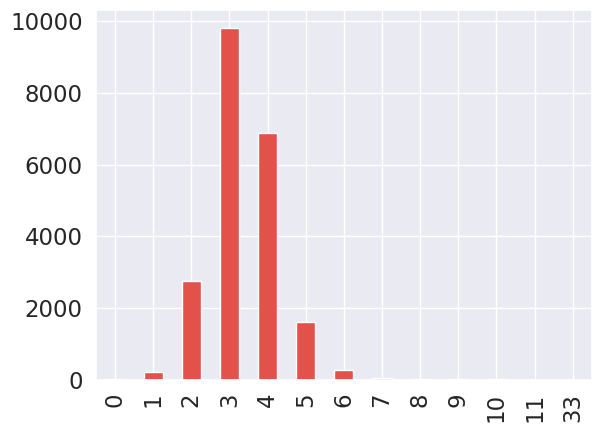

In [10]:
data['bedrooms'].value_counts().sort_index().plot.bar()
data['bedrooms'].value_counts().sort_index()

0.00      10
0.50       4
0.75      72
1.00    3852
1.25       9
1.50    1446
1.75    3048
2.00    1930
2.25    2047
2.50    5380
2.75    1185
3.00     753
3.25     589
3.50     731
3.75     155
4.00     136
4.25      79
4.50     100
4.75      23
5.00      21
5.25      13
5.50      10
5.75       4
6.00       6
6.25       2
6.50       2
6.75       2
7.50       1
7.75       1
8.00       2
Name: bathrooms, dtype: int64

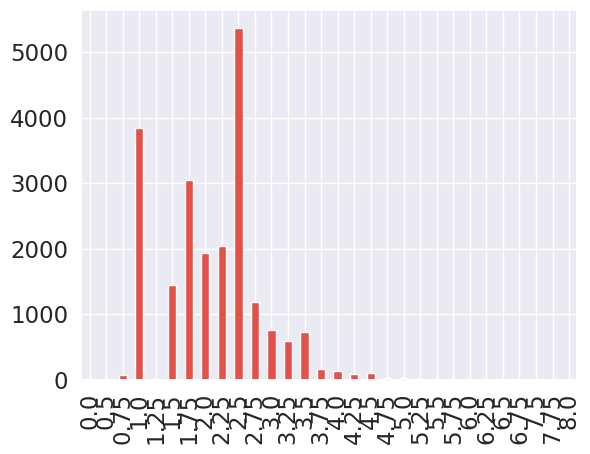

In [11]:
data['bathrooms'].value_counts().sort_index().plot.bar()
data['bathrooms'].value_counts().sort_index()

1.0    10680
1.5     1910
2.0     8241
2.5      161
3.0      613
3.5        8
Name: floors, dtype: int64

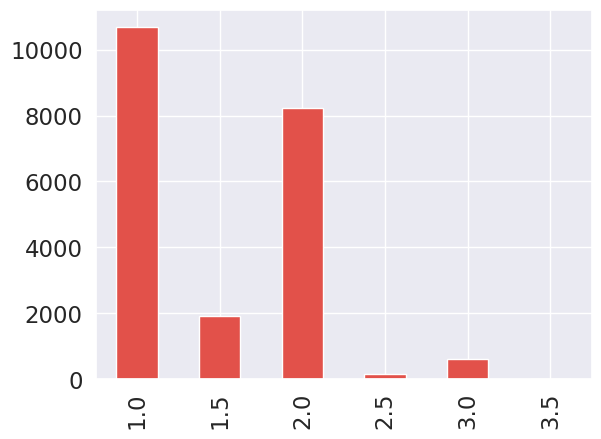

In [12]:
data['floors'].value_counts().sort_index().plot.bar()
data['floors'].value_counts().sort_index()

0    21450
1      163
Name: waterfront, dtype: int64

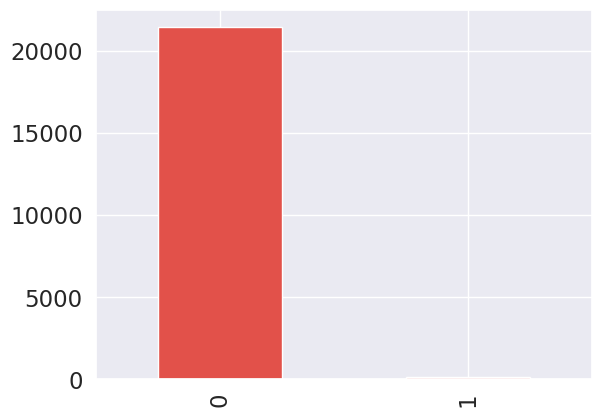

In [13]:
data['waterfront'].value_counts().sort_index().plot.bar()
data['waterfront'].value_counts().sort_index()

0    19489
1      332
2      963
3      510
4      319
Name: view, dtype: int64

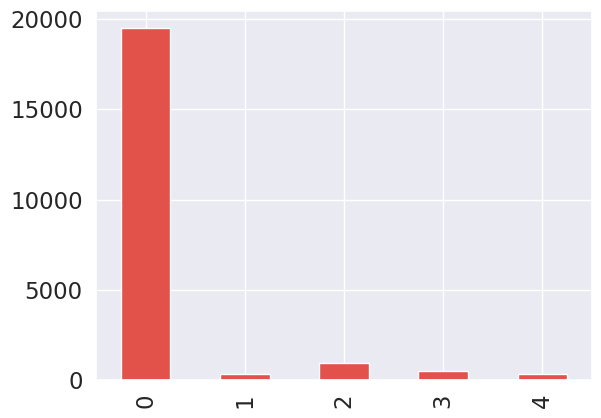

In [14]:
data['view'].value_counts().sort_index().plot.bar()
data['view'].value_counts().sort_index()

1       30
2      172
3    14031
4     5679
5     1701
Name: condition, dtype: int64

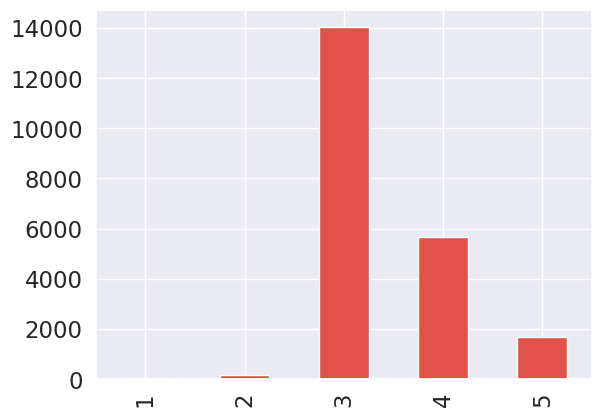

In [15]:
data['condition'].value_counts().sort_index().plot.bar()
data['condition'].value_counts().sort_index()

1        1
3        3
4       29
5      242
6     2038
7     8981
8     6068
9     2615
10    1134
11     399
12      90
13      13
Name: grade, dtype: int64

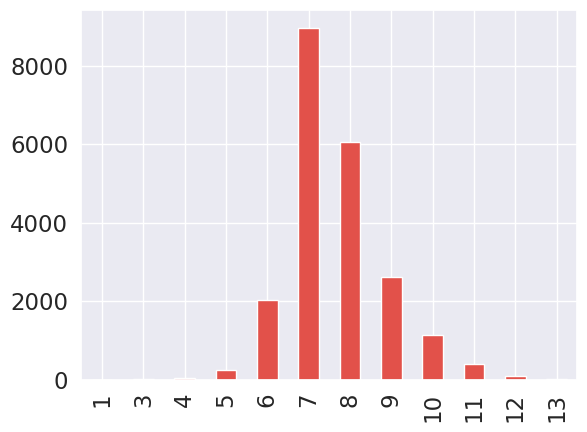

In [16]:
data['grade'].value_counts().sort_index().plot.bar()
data['grade'].value_counts().sort_index()

Fitting 10 distributions: 100%|██████████| 10/10 [00:02<00:00,  3.94it/s]


          sumsquare_error           aic            bic  kl_div  ks_statistic  \
cauchy       1.746704e-12   3754.968523 -800835.511282     inf      0.137688   
rayleigh     2.299140e-12  11847.856994 -794896.150487     inf      0.147454   
norm         3.909172e-12  14658.914100 -783424.178427     inf      0.145727   
exponpow     6.107440e-12  11272.089734 -773770.865066     inf      0.180913   
expon        6.558930e-12   4253.470624 -772239.411398     inf      0.210374   

          ks_pvalue  
cauchy          0.0  
rayleigh        0.0  
norm            0.0  
exponpow        0.0  
expon           0.0  


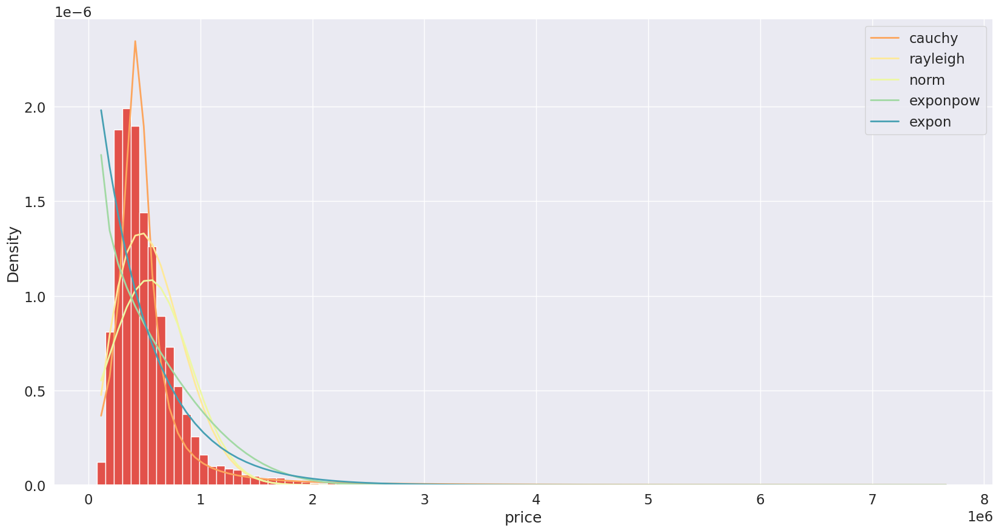

Fitting 10 distributions: 100%|██████████| 10/10 [00:03<00:00,  2.84it/s]


          sumsquare_error           aic            bic  kl_div  ks_statistic  \
cauchy           1.754868   1317.735956 -203545.461090     inf      0.301497   
norm             2.035370  30592.164712 -200340.601383     inf      0.247008   
lognorm          2.038591   7975.394039 -200296.445155     inf      0.232459   
gamma            2.038799  10209.225859 -200294.240300     inf      0.233080   
rayleigh         2.374024   5796.416132 -197014.175806     inf      0.383591   

          ks_pvalue  
cauchy          0.0  
norm            0.0  
lognorm         0.0  
gamma           0.0  
rayleigh        0.0  


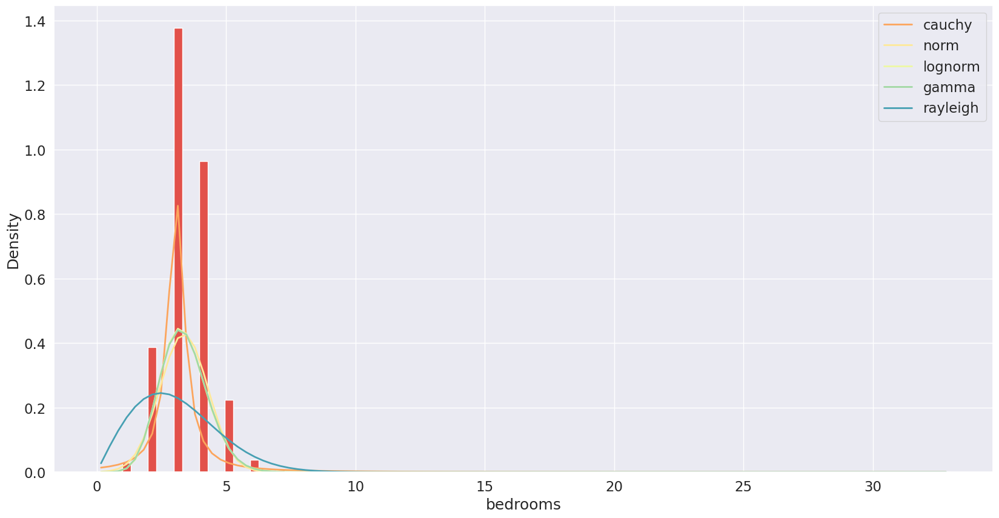

Fitting 10 distributions: 100%|██████████| 10/10 [00:03<00:00,  3.15it/s]


          sumsquare_error          aic            bic  kl_div  ks_statistic  \
norm            17.496044  1633.880386 -153844.616446     inf      0.131946   
lognorm         17.665069  1067.447314 -153626.839355     inf      0.138249   
gamma           17.678535  1078.979295 -153610.369990     inf      0.138491   
exponpow        17.837310  3620.594688 -153417.125022     inf      0.169732   
cauchy          17.927692   653.537266 -153317.869563     inf      0.136990   

          ks_pvalue  
norm            0.0  
lognorm         0.0  
gamma           0.0  
exponpow        0.0  
cauchy          0.0  


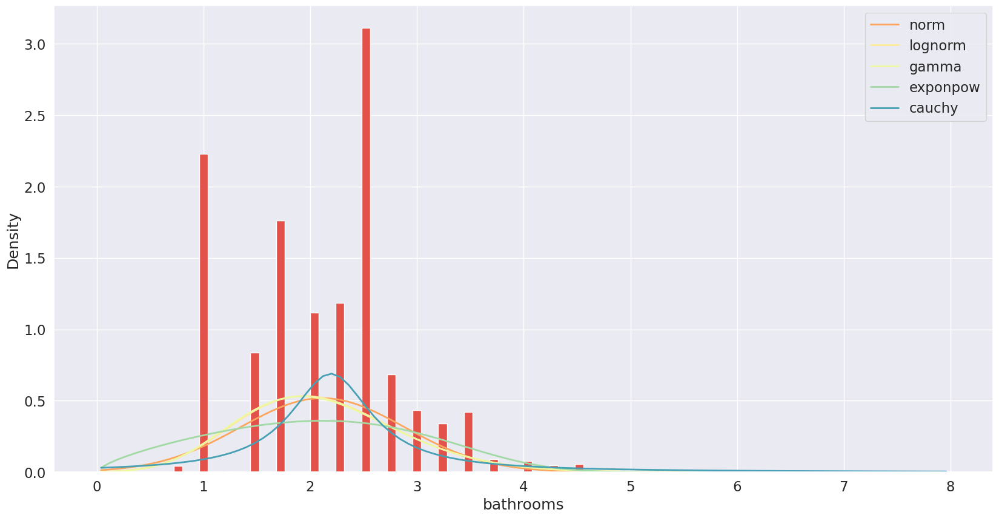

Fitting 10 distributions: 100%|██████████| 10/10 [00:02<00:00,  3.90it/s]


          sumsquare_error          aic            bic  kl_div  ks_statistic  \
lognorm      6.532616e-09  2730.400228 -623019.001509     inf      0.010115   
chi2         8.333058e-09  3148.472386 -617757.899175     inf      0.015876   
gamma        8.413309e-09  3146.133579 -617550.751064     inf      0.015953   
rayleigh     9.173642e-08  4100.306273 -565925.015910     inf      0.051426   
norm         2.104534e-07  6058.208434 -547978.775363     inf      0.078720   

              ks_pvalue  
lognorm    2.383433e-02  
chi2       3.669499e-05  
gamma      3.300354e-05  
rayleigh   4.074460e-50  
norm      6.108302e-117  


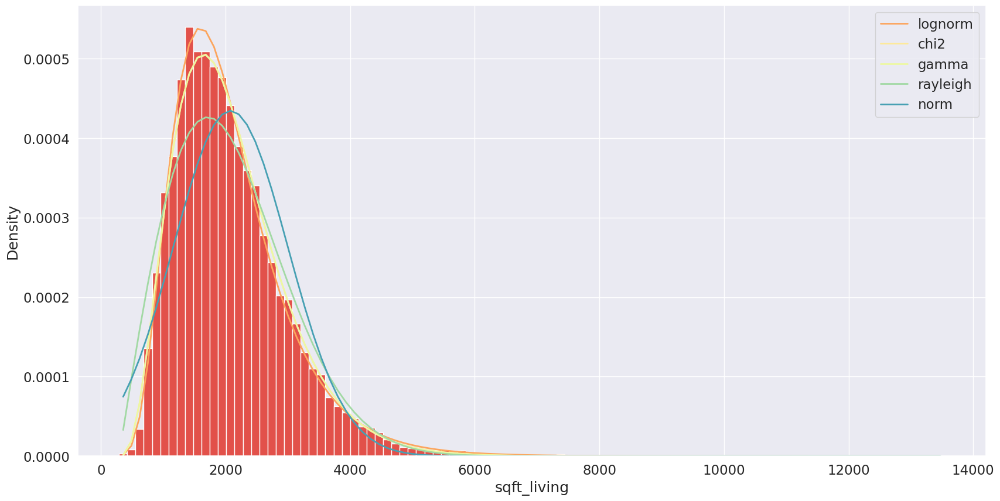

Fitting 10 distributions: 100%|██████████| 10/10 [00:02<00:00,  3.86it/s]


          sumsquare_error           aic            bic  kl_div  ks_statistic  \
lognorm      3.379632e-11   5053.368871 -736794.391290     inf      0.121290   
expon        2.853999e-10  13238.795311 -690692.184770     inf      0.251444   
chi2         7.614515e-10   7169.611280 -669472.606815     inf      0.225553   
cauchy       1.197354e-09   3982.703499 -659699.610014     inf      0.119371   
exponpow     1.445370e-09   3779.987661 -655620.966963     inf      0.419883   

              ks_pvalue  
lognorm   1.535546e-277  
expon      0.000000e+00  
chi2       0.000000e+00  
cauchy    8.169883e-269  
exponpow   0.000000e+00  


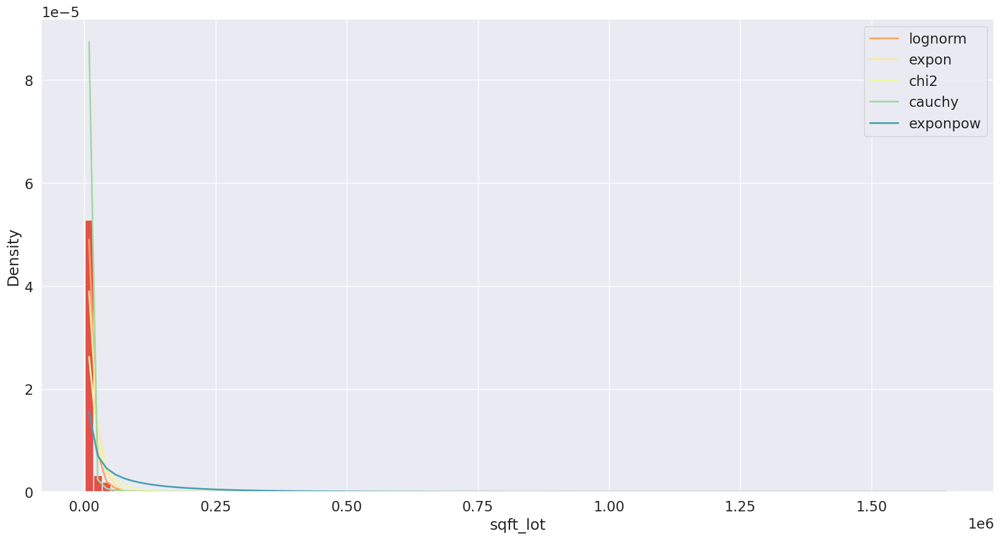

Fitting 10 distributions: 100%|██████████| 10/10 [00:02<00:00,  3.92it/s]


          sumsquare_error         aic           bic  kl_div  ks_statistic  \
exponpow       441.126465  475.640661 -84081.772256     inf      0.493259   
gamma          466.247672  527.509572 -82884.728186     inf      0.494147   
powerlaw       522.377599  590.401559 -80427.898089     inf      0.425074   
chi2           524.312502  302.898445 -80347.990785     inf      0.494147   
lognorm        526.342005  646.806270 -80264.492896     inf      0.493574   

          ks_pvalue  
exponpow        0.0  
gamma           0.0  
powerlaw        0.0  
chi2            0.0  
lognorm         0.0  


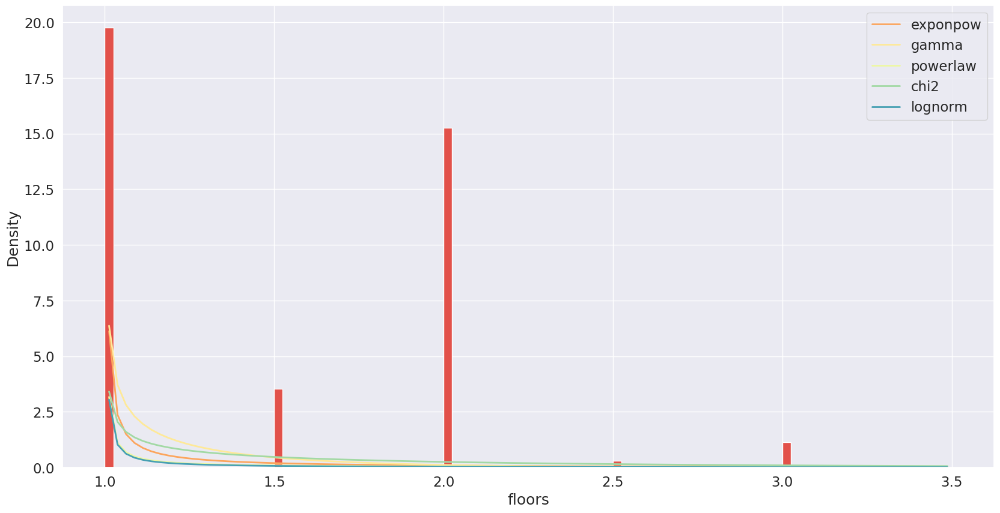

Fitting 10 distributions: 100%|██████████| 10/10 [00:04<00:00,  2.46it/s]


          sumsquare_error           aic           bic  kl_div  ks_statistic  \
expon         1310.664044  12286.049190 -60556.112960     inf      0.992458   
chi2          7949.529231    376.168056 -21586.996355     inf      0.992458   
exponpow      8327.218115    463.732456 -20583.791571     inf      0.986074   
gamma         8379.446781    578.126025 -20448.657258     inf      0.956089   
rayleigh      8815.026366   4429.513904 -19363.379842     inf      0.625906   

          ks_pvalue  
expon           0.0  
chi2            0.0  
exponpow        0.0  
gamma           0.0  
rayleigh        0.0  


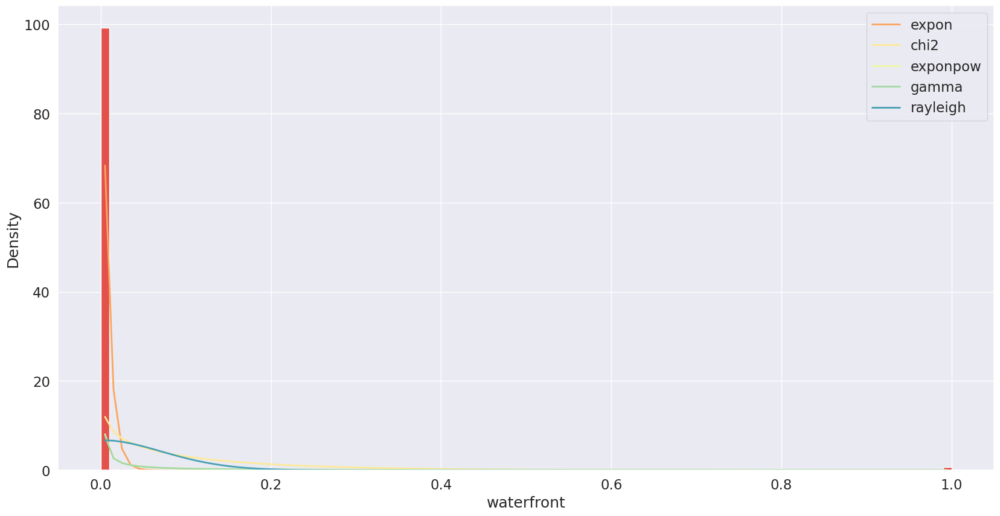

Fitting 10 distributions: 100%|██████████| 10/10 [00:03<00:00,  3.29it/s]


          sumsquare_error          aic           bic  kl_div  ks_statistic  \
expon          386.430315  1420.960334 -86952.883338     inf      0.901726   
gamma          399.511887   447.055169 -86223.363055     inf      0.901726   
chi2           441.665188   406.102897 -84055.393631     inf      0.901726   
exponpow       444.829418   792.191796 -83901.103275     inf      0.883890   
rayleigh       487.964208   928.585676 -81910.775655     inf      0.605875   

          ks_pvalue  
expon           0.0  
gamma           0.0  
chi2            0.0  
exponpow        0.0  
rayleigh        0.0  


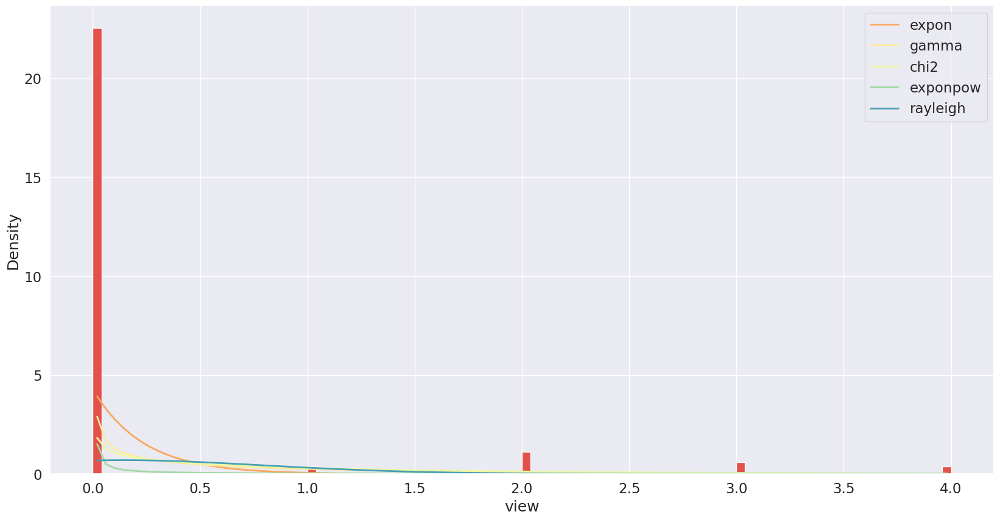

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  6.35it/s]


          sumsquare_error         aic           bic  kl_div  ks_statistic  \
lognorm        297.526283  776.321171 -92593.599193     inf      0.387343   
chi2           297.980366  685.346254 -92560.638712     inf      0.389227   
gamma          297.980368  685.345837 -92560.638575     inf      0.389227   
norm           299.325183  456.287264 -92473.297494     inf      0.393925   
exponpow       301.000590  360.375260 -92342.679683     inf      0.350941   

          ks_pvalue  
lognorm         0.0  
chi2            0.0  
gamma           0.0  
norm            0.0  
exponpow        0.0  


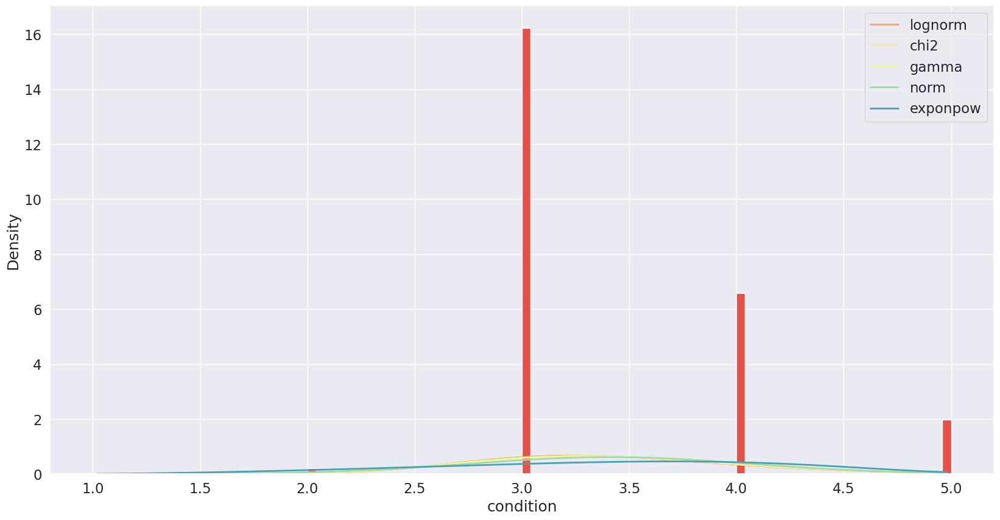

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  6.04it/s]


         sumsquare_error          aic            bic  kl_div  ks_statistic  \
cauchy         16.976843   710.702630 -154495.697690     inf      0.264354   
lognorm        17.066473  2071.737192 -154371.910227     inf      0.222264   
gamma          17.082312  1827.536592 -154351.861022     inf      0.225665   
chi2           17.082312  1827.536022 -154351.860887     inf      0.225665   
norm           17.143801  1119.791116 -154284.184755     inf      0.234419   

         ks_pvalue  
cauchy         0.0  
lognorm        0.0  
gamma          0.0  
chi2           0.0  
norm           0.0  


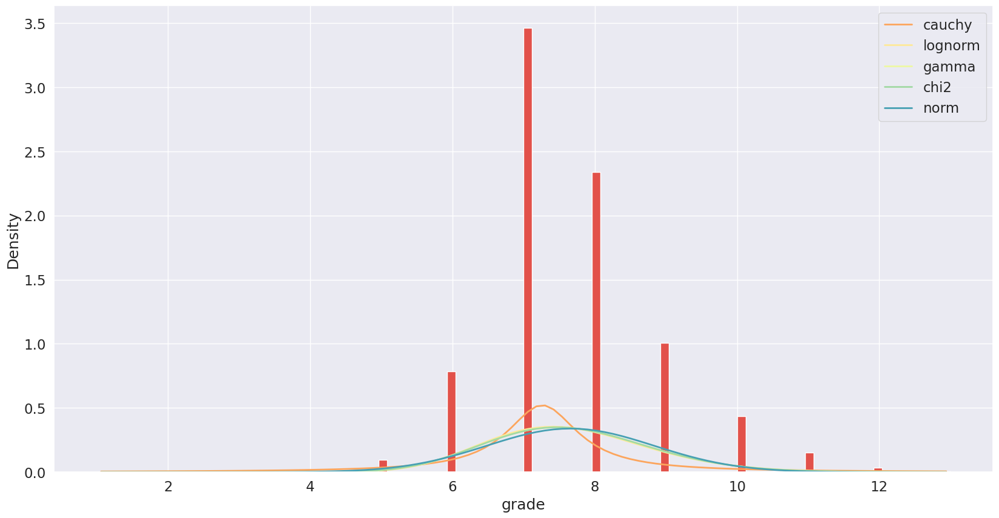

Fitting 10 distributions: 100%|██████████| 10/10 [00:03<00:00,  2.55it/s]


          sumsquare_error          aic            bic  kl_div  ks_statistic  \
chi2         3.377836e-07  2352.919047 -537742.794401     inf      0.061963   
gamma        3.662904e-07  2729.469962 -535991.684216     inf      0.097987   
rayleigh     4.593214e-07  3110.646030 -531110.130526     inf      0.082288   
cauchy       5.547380e-07  2176.169099 -527030.768504     inf      0.142392   
norm         8.561827e-07  3909.307634 -517650.989748     inf      0.117272   

              ks_pvalue  
chi2       1.396359e-72  
gamma     4.374202e-181  
rayleigh  9.334183e-128  
cauchy     0.000000e+00  
norm      1.990373e-259  


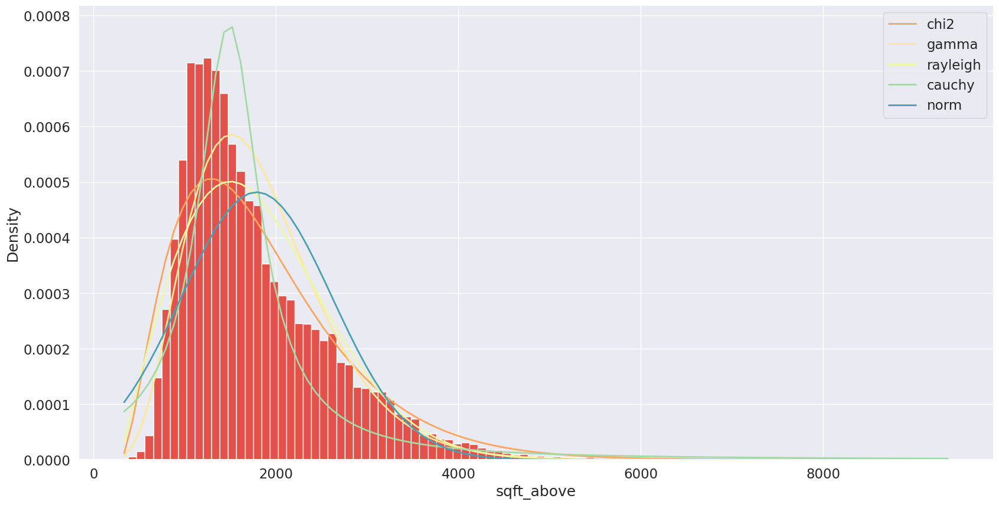

Fitting 10 distributions: 100%|██████████| 10/10 [00:04<00:00,  2.42it/s]


          sumsquare_error          aic            bic  kl_div  ks_statistic  \
exponpow         0.000077  2045.689566 -420319.692560     inf      0.607320   
chi2             0.000090  2099.139149 -417052.521765     inf      0.607320   
gamma            0.000100  3342.090724 -414680.312670     inf      0.603066   
expon            0.000109  2792.479194 -412984.775592     inf      0.607320   
lognorm          0.000124  2240.501503 -410025.398257     inf      0.607318   

          ks_pvalue  
exponpow        0.0  
chi2            0.0  
gamma           0.0  
expon           0.0  
lognorm         0.0  


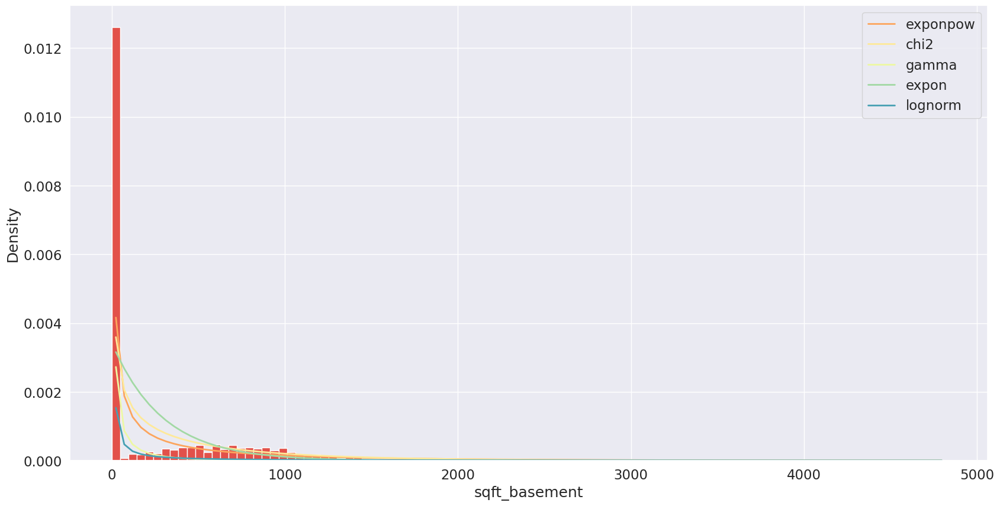

Fitting 10 distributions: 100%|██████████| 10/10 [00:03<00:00,  2.84it/s]


          sumsquare_error          aic            bic    kl_div  ks_statistic  \
powerlaw         0.002198   978.733017 -347962.571158  0.132719      0.042302   
norm             0.003044  1012.668152 -340937.835703  0.182557      0.070221   
lognorm          0.003068  1015.096759 -340760.081571  0.184562      0.072361   
gamma            0.003099  1013.799205 -340543.753801  0.187733      0.076163   
chi2             0.003129  1012.858586 -340330.255123  0.190890      0.083536   

              ks_pvalue  
powerlaw   4.819403e-34  
norm       4.076675e-93  
lognorm    7.398690e-99  
gamma     1.745386e-109  
chi2      1.181434e-131  


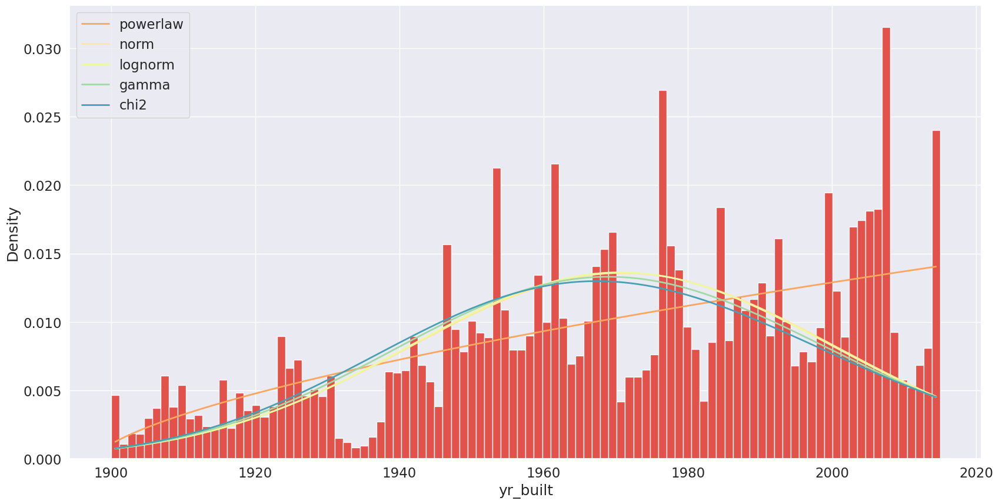

Fitting 10 distributions: 100%|██████████| 10/10 [00:04<00:00,  2.45it/s]


          sumsquare_error          aic            bic  kl_div  ks_statistic  \
expon            0.001553  3278.495721 -355488.144792     inf      0.957711   
gamma            0.001602  1752.060087 -354802.423226     inf      0.957711   
exponpow         0.001857  1655.553464 -351609.920967     inf      0.957711   
chi2             0.002009  1646.128261 -349905.123486     inf      0.957711   
rayleigh         0.002164  2192.985212 -348309.992277     inf      0.629965   

          ks_pvalue  
expon           0.0  
gamma           0.0  
exponpow        0.0  
chi2            0.0  
rayleigh        0.0  


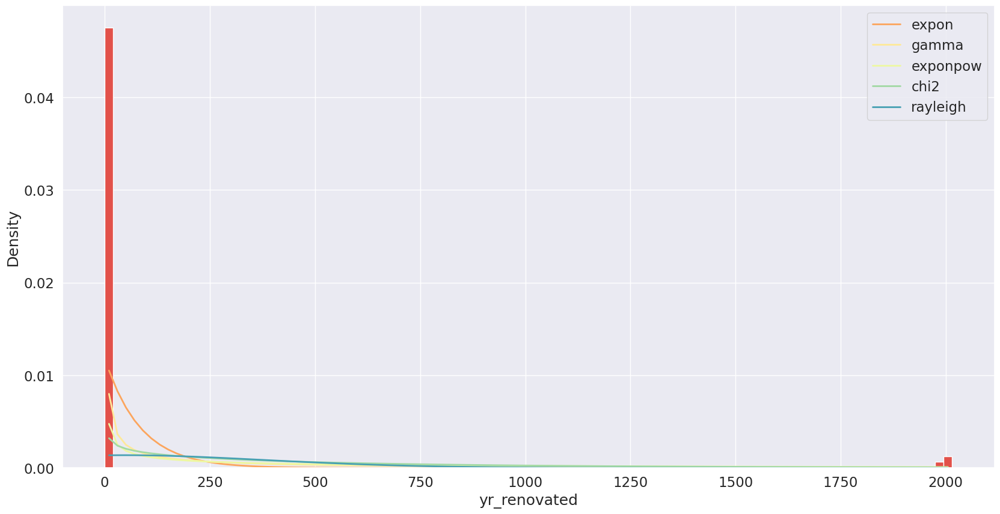

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  5.00it/s]


          sumsquare_error          aic            bic  kl_div  ks_statistic  \
gamma            0.003276  1119.612313 -339338.206876     inf      0.143731   
chi2             0.003276  1119.612324 -339338.202220     inf      0.143732   
expon            0.003290  1129.948709 -339257.165041     inf      0.146263   
rayleigh         0.003394  1107.186217 -338583.923185     inf      0.113228   
uniform          0.003443  1061.653406 -338275.784779     inf      0.199159   

              ks_pvalue  
gamma      0.000000e+00  
chi2       0.000000e+00  
expon      0.000000e+00  
rayleigh  7.964463e-242  
uniform    0.000000e+00  


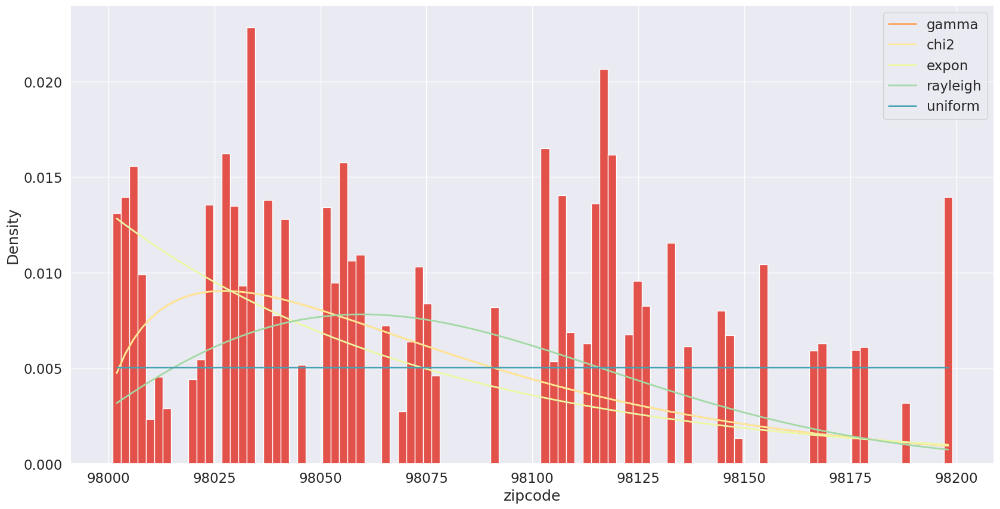

Fitting 10 distributions: 100%|██████████| 10/10 [00:02<00:00,  4.00it/s]


          sumsquare_error        aic            bic  kl_div  ks_statistic  \
powerlaw        35.823998 -33.717990 -138345.825577     inf      0.061509   
exponpow        36.184079 -10.565984 -138129.669315     inf      0.054006   
norm            53.639604   5.589122 -129631.293639     inf      0.072724   
lognorm         54.478798   7.670982 -129285.793952     inf      0.075106   
gamma           56.991908   8.627419 -128311.097721     inf      0.077413   

              ks_pvalue  
powerlaw   1.582875e-71  
exponpow   3.144073e-55  
norm      7.577054e-100  
lognorm   1.783396e-106  
gamma     4.242577e-113  


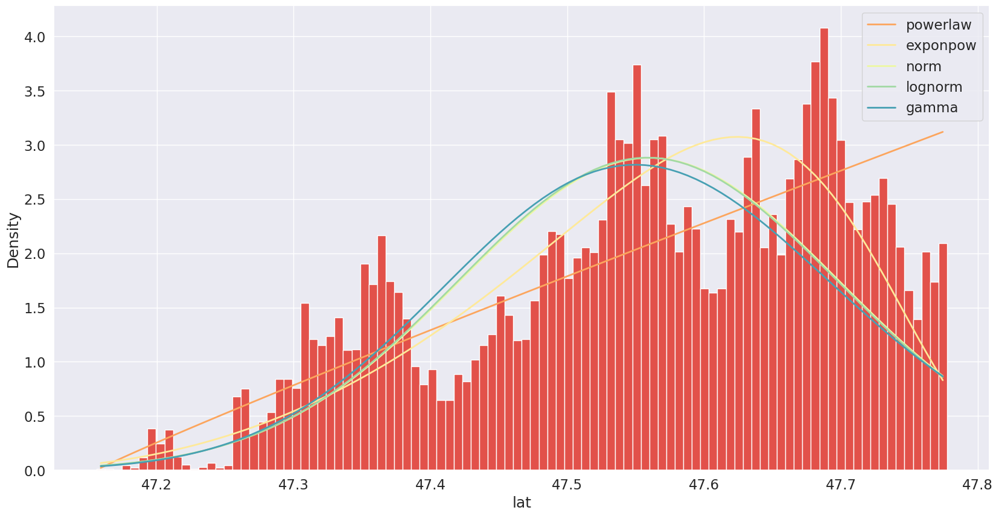

Fitting 10 distributions: 100%|██████████| 10/10 [00:01<00:00,  6.18it/s]


          sumsquare_error          aic            bic  kl_div  ks_statistic  \
lognorm         26.999919   376.185876 -144457.638549     inf      0.054318   
gamma           27.615029   447.507843 -143970.778088     inf      0.066210   
rayleigh        32.351200   447.057195 -140559.616421     inf      0.103089   
norm            40.805046   849.289394 -135542.058802     inf      0.106351   
exponpow        43.243848  1253.589532 -134277.459511     inf      0.122231   

              ks_pvalue  
lognorm    7.253301e-56  
gamma      8.059442e-83  
rayleigh  1.975442e-200  
norm      2.545153e-213  
exponpow  7.170306e-282  


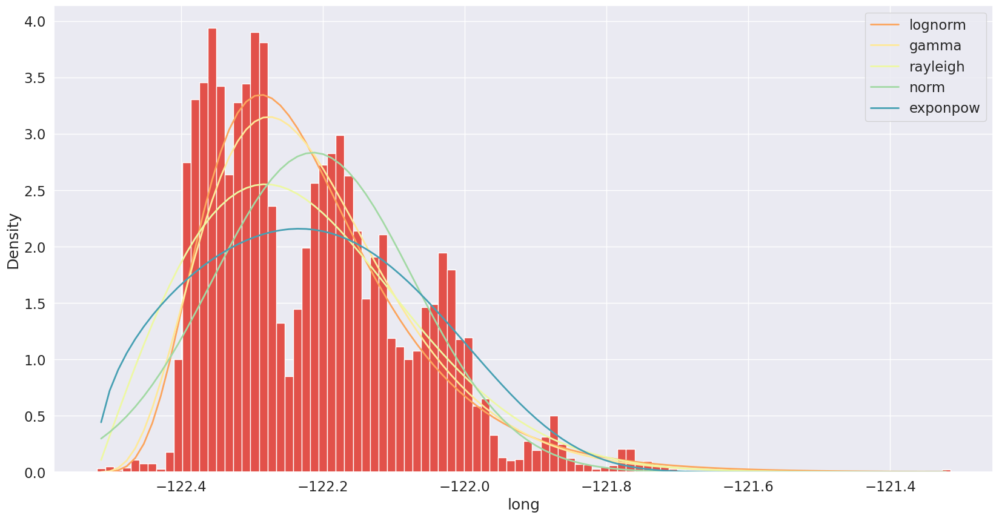

Fitting 10 distributions: 100%|██████████| 10/10 [00:02<00:00,  3.72it/s]


          sumsquare_error          aic            bic  kl_div  ks_statistic  \
lognorm      1.027097e-07  2115.404792 -563473.041076     inf      0.022556   
gamma        2.156969e-07  2165.661902 -547436.901422     inf      0.041084   
chi2         2.156969e-07  2165.662088 -547436.897252     inf      0.041084   
norm         8.957996e-07  2462.547996 -516673.370142     inf      0.088997   
rayleigh     9.004018e-07  2066.143031 -516562.615808     inf      0.122373   

              ks_pvalue  
lognorm    5.521818e-10  
gamma      3.893670e-32  
chi2       3.893171e-32  
norm      2.117885e-149  
rayleigh  1.590707e-282  


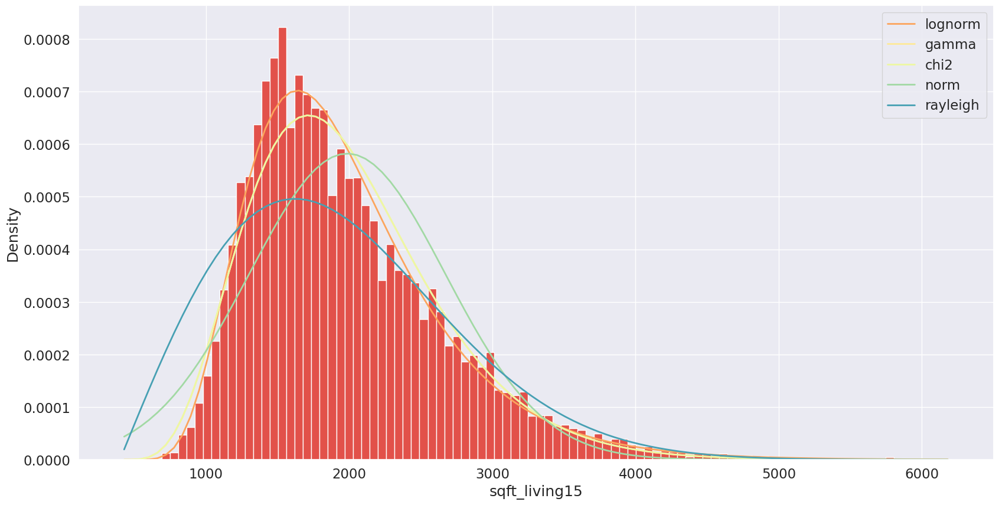

Fitting 10 distributions: 100%|██████████| 10/10 [00:03<00:00,  2.57it/s]


          sumsquare_error           aic            bic  kl_div  ks_statistic  \
lognorm      1.093622e-10   4737.626035 -711413.958299     inf      0.129203   
cauchy       1.223640e-10   3742.098459 -708996.041769     inf      0.110515   
chi2         6.014676e-10   9144.173274 -674570.115407     inf      0.224358   
expon        6.044563e-10   9068.736175 -674472.964793     inf      0.223278   
exponpow     1.592278e-09  11242.921005 -653528.810771     inf      0.257045   

              ks_pvalue  
lognorm   5.154251e-315  
cauchy    2.290307e-230  
chi2       0.000000e+00  
expon      0.000000e+00  
exponpow   0.000000e+00  


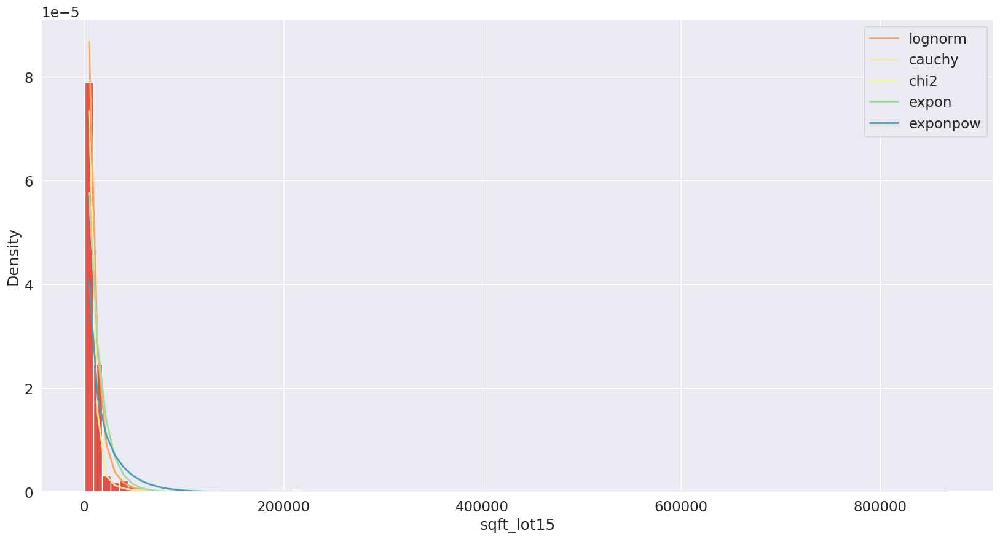

In [17]:
plt.rcParams["figure.figsize"] = (20, 10)
for i in data.columns:
    values = data[i].values
    f = Fitter(values, distributions=get_common_distributions())
    f.fit()
    print(f.summary())
    plt.ylabel("Density")
    plt.xlabel(i)
    plt.show()

<Axes: >

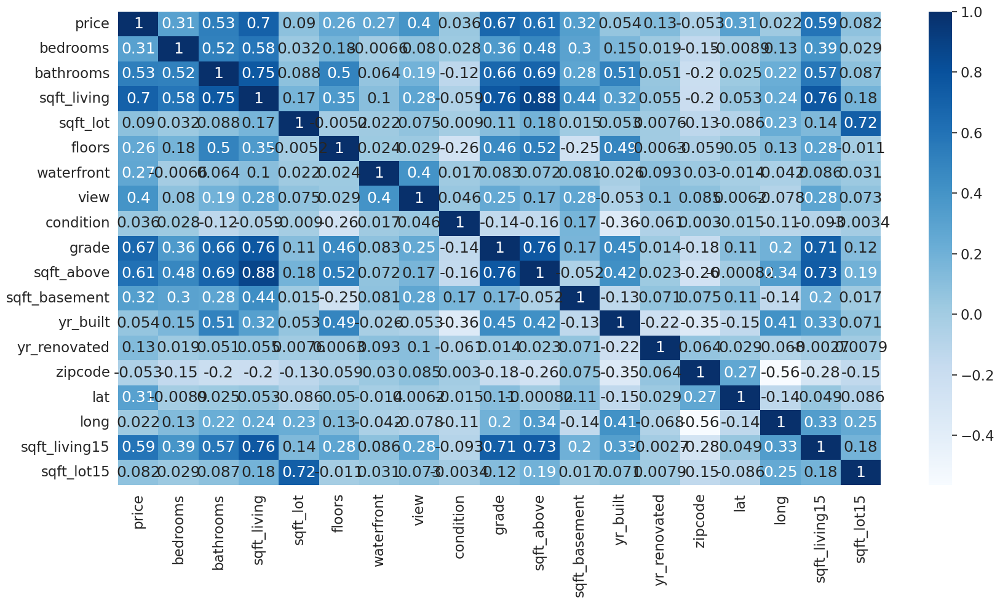

In [18]:
plt.rcParams["figure.figsize"] = (20, 10)
sns.heatmap(
    data.corr(), annot=True, cmap="Blues"
)  # Hea

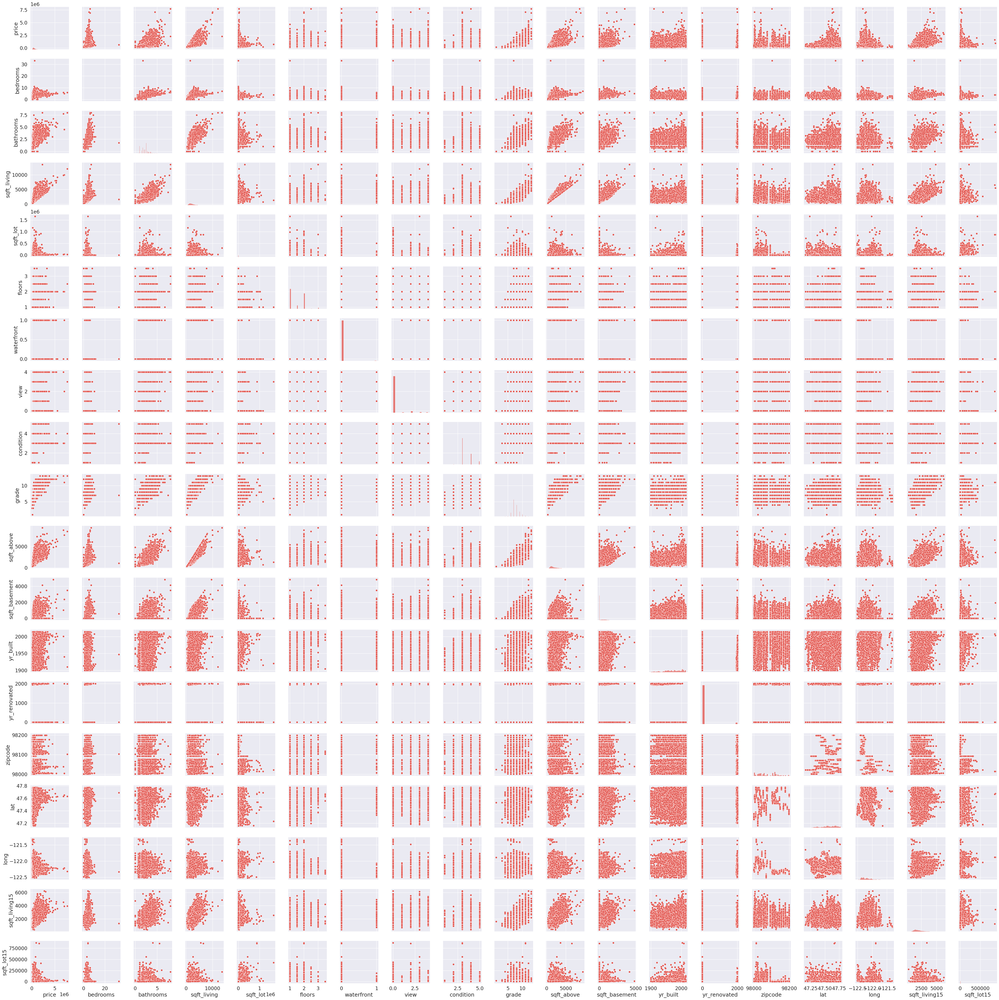

In [19]:
# All attributes are plotted against each other to see the pattern of distribution
sns.pairplot(data)

### **What kind of data exploration did you do?**
Preliminary findings from the EDA.

**Datatype Check** - All the features in the dataset are Integers/ Float.


**Missing Data Check** - The Dataset Didn't had any missing values in any of the features.


**Distribution of training data** - The probability distribution of each and every feature in the training dataset


**Correlation Check** - Correlation check was done on the dataset using heatmap and pirplot, the findings from it was that the didn't had any significant multi colinearity issues.


**Barplot** - Performed Barplot analysis to findout how a variable impacts the price of houses.
The above graphs are a cohesive representation of how house price is changing w.r.t. all the significant variables.


### **Data Cleaning**
This dataset was relatively cleaner with no missing values. But handing missing values is one of the most important tasks in any Data Science project.

### **Handling Missing Data**
In any ML modeling task, one of the very important task is to check if we have any missing values in our dataset. If there are missing values in the dataset it can horribly change the results and make our model inefficient.
But there are ways to tackle this problem, we will discuss these methods in a bit detail below

### **How to handle missing data - Data Imputation techniques**

*   Delete rows with missing data
*   Fill the missing data points by either mean/mode/median
*   Model a regression with rest of the feature as input and the missing value as the target i.e. MICE Imputation



Our dataset doesn't have any missing values, lets deliberately create some missing values and have a comparative analysis of how effectively each method is recovering the data back.

We will remove 1%, 5% and 10% of the data from 'grade' in our dataset and see how well Mean Imputation, Median Imputation and MICE imputation will recover the data back

In [20]:
data.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [21]:
df_imputation = data.copy()
# Creating three extra coloumns of grade for performing Data Imputation techniques
df_imputation["grade_1_percent"] = df_imputation[["grade"]]
df_imputation["grade_5_percent"] = df_imputation[["grade"]]
df_imputation["grade_10_percent"] = df_imputation[["grade"]]

In [22]:
# Function to calculate percentage of missing data in dataset
def get_percent_missing(dataframe):

    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame(
        {"column_name": dataframe.columns, "percent_missing": percent_missing}
    )
    return missing_value_df


# Function to create missing values
def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac=percent).index, col] = np.nan


# Modified function to impute data using mean imputation
def mean_impute(train_df):
    mean_impute_train_df = train_df.copy()  # Make a copy of dataframe for imputation
    mean_impute_train_df["grade_1_percent"] = mean_impute_train_df[
        "grade_1_percent"
    ].fillna(mean_impute_train_df["grade"].mean())
    mean_impute_train_df["grade_5_percent"] = mean_impute_train_df[
        "grade_5_percent"
    ].fillna(mean_impute_train_df["grade"].mean())
    mean_impute_train_df["grade_10_percent"] = mean_impute_train_df[
        "grade_10_percent"
    ].fillna(mean_impute_train_df["grade"].mean())
    return mean_impute_train_df

# Modified function to impute data using median imputation
def median_impute(train_df):
    median_impute_train_df = train_df.copy()  # Make a copy of dataframe for imputation
    median_impute_train_df["grade_1_percent"] = median_impute_train_df[
        "grade_1_percent"
    ].fillna(median_impute_train_df["grade"].median())
    median_impute_train_df["grade_5_percent"] = median_impute_train_df[
        "grade_5_percent"
    ].fillna(median_impute_train_df["grade"].median())
    median_impute_train_df["grade_10_percent"] = median_impute_train_df[
        "grade_10_percent"
    ].fillna(median_impute_train_df["grade"].median())
    return median_impute_train_df

# Function to impute data using MICE method
def mice_impute(train_df):
    mice_imputed_train_df = pd.DataFrame(
        MICE().fit_transform(train_df), columns=list(train_df.columns)
    )
    return mice_imputed_train_df


# Function to calculate how well the data has been recovered after performing data imputation
def percentage_change(l1, l2):
    percent_change = abs(l2 - l1) / (l1 + 0.000000001)
    avg_change = (percent_change.sum() / percent_change.count()) * 100
    return avg_change

In [23]:
# Checking for % missing values in dataset
print(get_percent_missing(df_imputation))

                       column_name  percent_missing
price                        price              0.0
bedrooms                  bedrooms              0.0
bathrooms                bathrooms              0.0
sqft_living            sqft_living              0.0
sqft_lot                  sqft_lot              0.0
floors                      floors              0.0
waterfront              waterfront              0.0
view                          view              0.0
condition                condition              0.0
grade                        grade              0.0
sqft_above              sqft_above              0.0
sqft_basement        sqft_basement              0.0
yr_built                  yr_built              0.0
yr_renovated          yr_renovated              0.0
zipcode                    zipcode              0.0
lat                            lat              0.0
long                          long              0.0
sqft_living15        sqft_living15              0.0
sqft_lot15  

In [24]:
# Creating missing values in respected coloumns to perform data imputation
create_missing(df_imputation, 0.01, "grade_1_percent")
create_missing(df_imputation, 0.05, "grade_5_percent")
create_missing(df_imputation, 0.1, "grade_10_percent")

In [25]:
# Performing Mean Imputation
mean_imputed_df_imputation = mean_impute(df_imputation)

In [26]:
# Performing Mean Imputation
median_imputed_df_imputation = median_impute(df_imputation)

In [27]:
# Dataframe for 1% missing value
df_imputation_1_percent = df_imputation.drop(
    ["grade", "grade_5_percent", "grade_10_percent"], axis=1
)
# Dataframe for 5% missing value
df_imputation_5_percent = df_imputation.drop(
    ["grade", "grade_1_percent", "grade_10_percent"], axis=1
)
# Dataframe for 10% missing value
df_imputation_10_percent = df_imputation.drop(
    ["grade", "grade_1_percent", "grade_5_percent"], axis=1
)

# Performing Imputation on Dataframe with 1% missing values
mice_imputed_df_imputation_1_percent = mice_impute(df_imputation_1_percent)
# Performing Imputation on Dataframe with 5% missing values
mice_imputed_df_imputation_5_percent = mice_impute(df_imputation_5_percent)
# Performing Imputation on Dataframe with 10% missing values
mice_imputed_df_imputation_10_percent = mice_impute(df_imputation_10_percent)

In [28]:
# This is the average % error on residuals for 1% missing data imputed using Mean Imputation
print("Average % error on residuals for 1% missing data imputed using Mean Imputation")
print(
    percentage_change(
        mean_imputed_df_imputation["grade"],
        mean_imputed_df_imputation["grade_1_percent"],
    )
)

# This is the average % error on residuals for 1% missing data imputed using Median Imputation
print("Average % error on residuals for 1% missing data imputed using Median Imputation")
print(
    percentage_change(
        median_imputed_df_imputation["grade"],
        median_imputed_df_imputation["grade_1_percent"],
    )
)

# This is the average % error on residuals for 1% missing data imputed using MICE Imputation
print("Average % error on residuals for 1% missing data imputed using MICE Imputation")
print(
    percentage_change(
        df_imputation["grade"],
        mice_imputed_df_imputation_1_percent["grade_1_percent"],
    )
)
print("\n")

# This is the average % error on residuals for 5% missing data imputed using Mean Imputation
print("Average % error on residuals for 5% missing data imputed using Mean Imputation")
print(
    percentage_change(
        mean_imputed_df_imputation["grade"],
        mean_imputed_df_imputation["grade_5_percent"],
    )
)

# This is the average % error on residuals for 5% missing data imputed using Median Imputation
print("Average % error on residuals for 5% missing data imputed using Median Imputation")
print(
    percentage_change(
        median_imputed_df_imputation["grade"],
        median_imputed_df_imputation["grade_5_percent"],
    )
)

# This is the average % error on residuals for 5% missing data imputed using MICE Imputation
print("Average % error on residuals for 5% missing data imputed using MICE Imputation")
print(
    percentage_change(
        df_imputation["grade"],
        mice_imputed_df_imputation_5_percent["grade_5_percent"],
    )
)
print("\n")

# This is the average % error on residuals for 10% missing data imputed using Mean Imputation
print("Average % error on residuals for 10% missing data imputed using Mean Imputation")
print(
    percentage_change(
        mean_imputed_df_imputation["grade"],
        mean_imputed_df_imputation["grade_10_percent"],
    )
)

# This is the average % error on residuals for 10% missing data imputed using Median Imputation
print("Average % error on residuals for 10% missing data imputed using Median Imputation")
print(
    percentage_change(
        median_imputed_df_imputation["grade"],
        median_imputed_df_imputation["grade_10_percent"],
    )
)

# This is the average % error on residuals for 10% missing data imputed using MICE Imputation
print("Average % error on residuals for 10% missing data imputed using MICE Imputation")
print(
    percentage_change(
        df_imputation["grade"],
        mice_imputed_df_imputation_10_percent["grade_10_percent"],
    )
)

Average % error on residuals for 1% missing data imputed using Mean Imputation
0.12044188034456067
Average % error on residuals for 1% missing data imputed using Median Imputation
0.11169705229786965
Average % error on residuals for 1% missing data imputed using MICE Imputation
0.06258820195024489


Average % error on residuals for 5% missing data imputed using Mean Imputation
0.602567697369622
Average % error on residuals for 5% missing data imputed using Median Imputation
0.5346000282418016
Average % error on residuals for 5% missing data imputed using MICE Imputation
0.3140697787205395


Average % error on residuals for 10% missing data imputed using Mean Imputation
1.2541255110103529
Average % error on residuals for 10% missing data imputed using Median Imputation
1.0810421012402198
Average % error on residuals for 10% missing data imputed using MICE Imputation
0.6309392057230914


### **Interpreting the Imputation Methods**
From the above 9 readings we can conclude that the MICE imputation works well when compared to the Mean imputation method as the imputed value is a function of rest of the features.

We can also observe that the % error of residuals increase as the missing data points increase. From this we can conclude that if we have less missing data in the dataset, more perfectly it is imputed back by the imputation method.

### **Why Imputing data is always better than deleting the row ?**
For obvious reason - Data Loss. When we delete a row we end up deleting a sample from training data which will do more harm to the model instead of doing any good.
Selecting of imputation method is really a personal choice, although from the above analysis we can come to the conclusion that MICE does a better job in getting the databack, but after creating a model it hardly has any positive effects on the accuracy of model. But it is always a better choice to use MICE as it can give you the closest possible value.

# **Feature Importance and Selection**

Lets fit a very simple linear model to understand how the features of houses are affecting its price

In [29]:
#checking the correlation between all the features in the data
data.corr()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
price,1.000000,0.308350,0.525138,0.702035,0.089661,0.256794,0.266369,0.397293,0.036362,0.667434,0.605567,0.323816,0.054012,0.126434,-0.053203,0.307003,0.021626,0.585379,0.082447
bedrooms,0.308350,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,0.356967,0.477600,0.303093,0.154178,0.018841,-0.152668,-0.008931,0.129473,0.391638,0.029244
bathrooms,0.525138,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,0.664983,0.685342,0.283770,0.506019,0.050739,-0.203866,0.024573,0.223042,0.568634,0.087175
sqft_living,0.702035,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,0.762704,0.876597,0.435043,0.318049,0.055363,-0.199430,0.052529,0.240223,0.756420,0.183286
sqft_lot,0.089661,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,0.183512,0.015286,0.053080,0.007644,-0.129574,-0.085683,0.229521,0.144608,0.718557
floors,0.256794,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,0.523885,-0.245705,0.489319,0.006338,-0.059121,0.049614,0.125419,0.279885,-0.011269
waterfront,0.266369,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,0.072075,0.080588,-0.026161,0.092885,0.030285,-0.014274,-0.041910,0.086463,0.030703
view,0.397293,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,0.251321,0.167649,0.276947,-0.053440,0.103917,0.084827,0.006157,-0.078400,0.280439,0.072575
condition,0.036362,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,-0.158214,0.174105,-0.361417,-0.060618,0.003026,-0.014941,-0.106500,-0.092824,-0.003406
grade,0.667434,0.356967,0.664983,0.762704,0.113621,0.458183,0.082775,0.251321,-0.144674,1.000000,0.755923,0.168392,0.446963,0.014414,-0.184862,0.114084,0.198372,0.713202,0.119248


<Axes: >

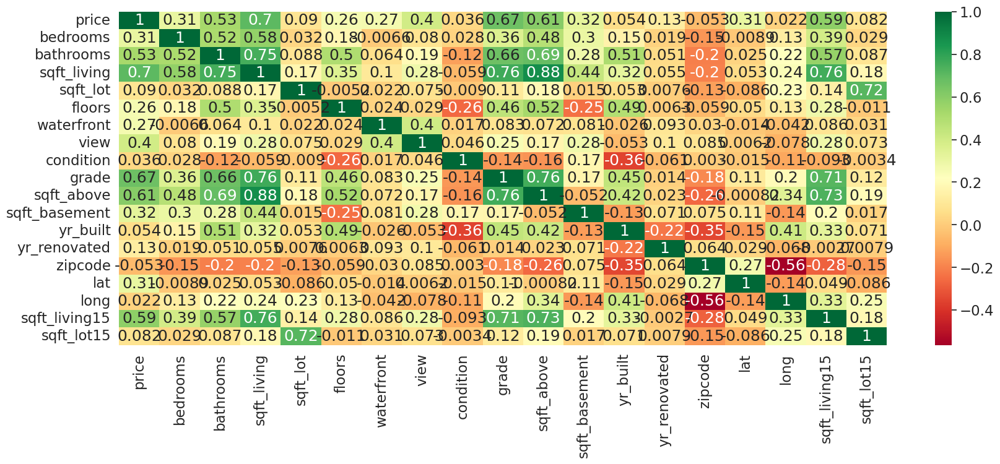

In [30]:
#the heat map of the correlation
plt.figure(figsize=(20,7))
sns.heatmap(data.corr(), annot=True, cmap='RdYlGn')

In [31]:
#Correlation matrix wrt 'price'
corr_tresh = 2 / np.sqrt(data.shape[0])
r = pd.DataFrame(data.corr())
output_r = pd.DataFrame(r.loc[:, "price"].abs())
output_r["correlated"] = output_r > corr_tresh
output_r

,price,correlated
price,1.000000,True
bedrooms,0.308350,True
bathrooms,0.525138,True
sqft_living,0.702035,True
sqft_lot,0.089661,True
floors,0.256794,True
waterfront,0.266369,True
view,0.397293,True
condition,0.036362,True
grade,0.667434,True


In [32]:
# Scaling the data using Min-Max scaling for the purpose of evaluating Co-efficients, as non scaled data may mislead while we evaluate the co-efficients
df = data.drop(["price"], axis=1)
df_norm = (df - df.min()) / (df.max() - df.min())
df_norm = pd.concat((df_norm, data.price), 1)

In [33]:
import statsmodels.formula.api as smf  # OLS model Library

results = smf.ols(
    "price ~ bedrooms + bathrooms + sqft_living + sqft_lot + floors + waterfront + view + condition + grade + sqft_above + sqft_basement + yr_built + yr_renovated + zipcode + lat + long + sqft_living15 + sqft_lot15",
    data=df_norm,
).fit()
print(results.summary())  # OLS Linear Model Summary

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.700
Model:                            OLS   Adj. R-squared:                  0.700
Method:                 Least Squares   F-statistic:                     2960.
Date:                Mon, 10 Apr 2023   Prob (F-statistic):               0.00
Time:                        01:28:18   Log-Likelihood:            -2.9460e+05
No. Observations:               21613   AIC:                         5.892e+05
Df Residuals:                   21595   BIC:                         5.894e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -4.442e+05    1.5e+04    -29.662

### **Null-Hypothesis**

P-Value - It stands for the probability value; it tells how likely it is that a result occurred by chance alone. Basically, the p-value is used in hypothesis testing to help you support or reject the null hypothesis. The smaller the p-value, the stronger the evidence to reject the null hypothesis.

All features in our dataset have P value < 0.05, except for 'floors'.

Lets consider only these features and calculate the model fit again, and then lets have a comparative analysis of both models.

### **Feature Selection**
Feature Selection is the process of selecting the features which are relevant to a machine learning model. It means that you select only those attributes that have a significant effect on the model's output.


In [34]:
data.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [35]:
df_norm_feature_selected = df_norm[
    [
        'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
    ]
]

In [36]:
#calculating accuracy by removing 'floors'
results2 = smf.ols(
    "price ~ bedrooms + bathrooms + sqft_living + sqft_lot + waterfront + view + condition + grade + sqft_basement + yr_built + yr_renovated + zipcode + lat + long",
    data=df_norm_feature_selected,
).fit()
print(results2.summary())  # OLS Linear Model Summary

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.699
Model:                            OLS   Adj. R-squared:                  0.699
Method:                 Least Squares   F-statistic:                     3580.
Date:                Mon, 10 Apr 2023   Prob (F-statistic):               0.00
Time:                        01:28:19   Log-Likelihood:            -2.9464e+05
No. Observations:               21613   AIC:                         5.893e+05
Df Residuals:                   21598   BIC:                         5.894e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -4.536e+05   1.48e+04    -30.558

In [37]:
#predicting accuracy with all variables
predicted_quality_1 = results.predict(
    df_norm[
        [
            'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15',
        ]
    ]
)
df_norm["predicted_price_1"] = predicted_quality_1.round()

In [38]:
predicted_quality_2 = results2.predict(
    df_norm_feature_selected[
        [
            'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
        ]
    ]
)
df_norm_feature_selected["predicted_price_2"] = predicted_quality_2.round()

In [39]:
# comparing accuracy of both models
print(
    "Accuracy of predicting the price of houses using all features = ",
    100 - percentage_change(df_norm["price"], df_norm["predicted_price_1"]),
)
print(
    "Accuracy of predicting the correct price of houses using only significant features is = ",
    100
    - percentage_change(
        df_norm_feature_selected["price"],
        df_norm_feature_selected["predicted_price_2"],
    ),
)

Accuracy of predicting the price of houses using all features =  74.42045622518411
Accuracy of predicting the correct price of houses using only significant features is =  74.36694943937799




*   From the above two summaries we can interpret that after selecting only the significant features(features with P value less than 0.05) it had little to no effect on the outcome compare to the model which uses all the features.

*   From the above two interpretations, our observation is that in both the cases our model predicts the price of houses pretty good and they are pretty close to each other. Model that uses all features slighly overcomes the model that is using only the statistically important features with and accuracy of 74.42% compared to the 74.36% of the later

From the above studies let's stick to the data with all featues and try using different models

In [40]:
df_norm = df_norm.drop(["predicted_price_1"], axis=1)

In [41]:
A = df_norm.drop(["price"], axis=1)  # Training Feature
B = df_norm["price"]  # Target

### **How did you split the data into train, and test?**

The data was splitted into Training ad Testing Data into 90% and 10% respectively.

In [42]:
(
    x_train,
    x_test,
    y_train,
    y_test,
) = tts(  # Splitting Data into Training and Test
    A, B, test_size=0.1, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process

### **Fitting a Linear Model**

In [43]:
linear_model = LinearRegression()
linear_model.fit(A, B)
print('Linear Regression Coefficients:', linear_model.coef_)

Linear Regression Coefficients: [-1180295.86764116   329154.22825944   872186.10652475   212294.37765946
    16723.87528771   582960.45842343   211483.76953727   105542.59655438
  1150685.34181779  1052472.82833878   406206.16535338  -301325.66929897
    39922.35617408  -115319.13339676   374728.57238308  -258534.71321695
   125990.61808078  -333108.47947988]


In [44]:
#Accuracy of linear regression model
y_linear_predictions = linear_model.predict(x_test).round()
100 - percentage_change(y_test, y_linear_predictions)

74.33156286727544

In [45]:
# Print coefficients with variable names
coefficients = pd.DataFrame({
    'Variable': A.columns,
    'Coefficient': linear_model.coef_/10000
})
print(coefficients)

         Variable  Coefficient
0        bedrooms  -118.029587
1       bathrooms    32.915423
2     sqft_living    87.218611
3        sqft_lot    21.229438
4          floors     1.672388
5      waterfront    58.296046
6            view    21.148377
7       condition    10.554260
8           grade   115.068534
9      sqft_above   105.247283
10  sqft_basement    40.620617
11       yr_built   -30.132567
12   yr_renovated     3.992236
13        zipcode   -11.531913
14            lat    37.472857
15           long   -25.853471
16  sqft_living15    12.599062
17     sqft_lot15   -33.310848


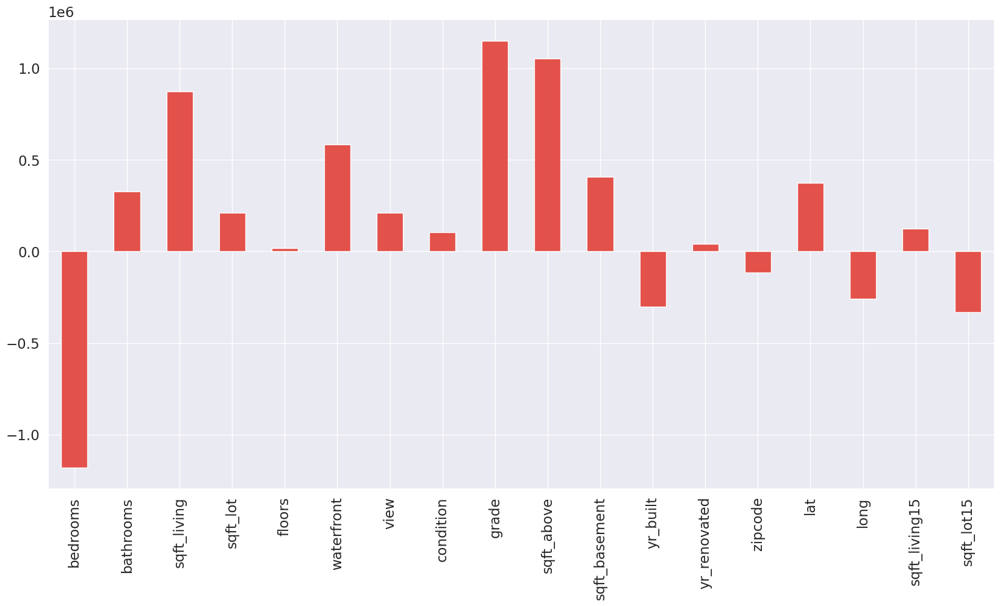

In [46]:
# Plot coefficients
coefficients = pd.Series(linear_model.coef_, index=A.columns)
coefficients.plot(kind='bar')
plt.show()

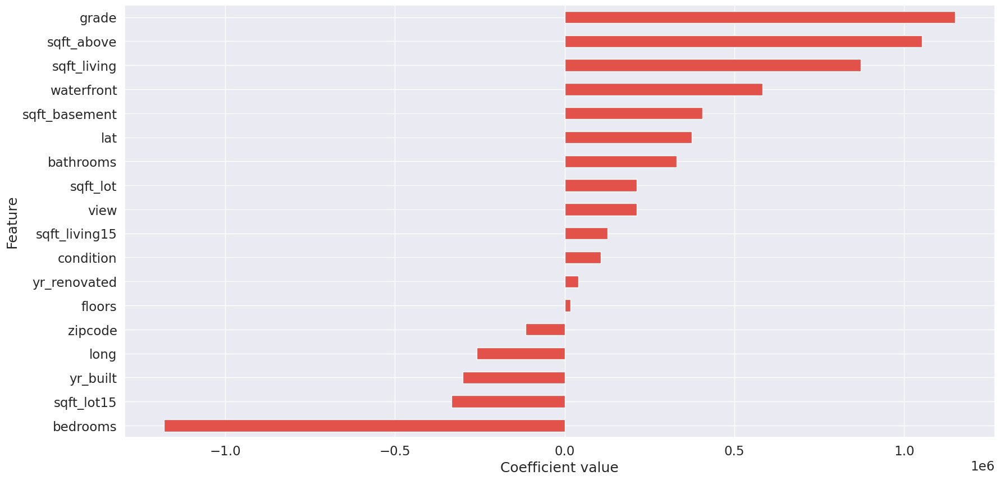

In [47]:
# Create horizontal bar chart of coefficients
coefficients = pd.Series(linear_model.coef_, index=A.columns)
coefficients.sort_values().plot(kind='barh')
plt.xlabel('Coefficient value')
plt.ylabel('Feature')
plt.show()

### **Fitting Tree Based Models**

#### **Decision Tree**

In [48]:
from sklearn.tree import DecisionTreeRegressor
# Fit a decision tree model
tree_model1 = DecisionTreeRegressor()
tree_model1.fit(A, B)
print('Decision Tree Model Nodes:', tree_model1.tree_.node_count)

Decision Tree Model Nodes: 41455


In [49]:
#Accuracy of Decision Tree Regression Model
y_tree_based_predictions1 = tree_model1.predict(x_test).round()
100 - percentage_change(y_test, y_tree_based_predictions1)

99.63763961132415

In [50]:
from sklearn.tree import DecisionTreeClassifier, export_text

# Export the tree as text and print the rules for each node
r = export_text(tree_model1, feature_names=list(A.columns.values))
print(r)

|--- grade <= 0.62
|   |--- lat <= 0.61
|   |   |--- sqft_living <= 0.12
|   |   |   |--- sqft_living <= 0.09
|   |   |   |   |--- long <= 0.12
|   |   |   |   |   |--- view <= 0.38
|   |   |   |   |   |   |--- lat <= 0.47
|   |   |   |   |   |   |   |--- long <= 0.06
|   |   |   |   |   |   |   |   |--- yr_built <= 0.91
|   |   |   |   |   |   |   |   |   |--- floors <= 0.10
|   |   |   |   |   |   |   |   |   |   |--- long <= 0.05
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 5
|   |   |   |   |   |   |   |   |   |   |--- long >  0.05
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 3
|   |   |   |   |   |   |   |   |   |--- floors >  0.10
|   |   |   |   |   |   |   |   |   |   |--- lat <= 0.34
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 3
|   |   |   |   |   |   |   |   |   |   |--- lat >  0.34
|   |   |   |   |   |   |   |   |   |   |   |--- value: [300000.00]
|   |   |   |   |   |   |   |   |---

#### **Random Forest**

In [51]:
from sklearn.ensemble import RandomForestRegressor

tree_model2 = RandomForestRegressor(
    max_depth=A.shape[1], random_state=0, n_estimators=10
)
tree_model2.fit(x_train, y_train)

RandomForestRegressor(max_depth=18, n_estimators=10, random_state=0)

In [52]:
y_tree_based_predictions2 = tree_model2.predict(x_test).round()
100 - percentage_change(y_test, y_tree_based_predictions2)

86.10432976173557

In [53]:
# Print the feature importances
importances = tree_model2.feature_importances_
for feature, importance in zip(list(A.columns.values), importances):
    print(f"{feature}: {importance:.3f}")

bedrooms: 0.003
bathrooms: 0.011
sqft_living: 0.261
sqft_lot: 0.015
floors: 0.002
waterfront: 0.035
view: 0.011
condition: 0.003
grade: 0.320
sqft_above: 0.018
sqft_basement: 0.005
yr_built: 0.027
yr_renovated: 0.006
zipcode: 0.015
lat: 0.160
long: 0.068
sqft_living15: 0.028
sqft_lot15: 0.013


In [54]:
# Print the rules for each tree in the forest
for i, tree in enumerate(tree_model2.estimators_):
    tree_rules = export_text(tree, feature_names=list(A.columns.values))
    print(f"Tree {i+1}:\n{tree_rules}")

Streaming output truncated to the last 5000 lines.
|   |   |   |   |   |   |   |   |   |--- condition >  0.88
|   |   |   |   |   |   |   |   |   |   |--- value: [549000.00]
|   |   |   |   |   |   |   |   |--- bathrooms >  0.28
|   |   |   |   |   |   |   |   |   |--- value: [429592.00]
|   |   |   |   |   |   |   |--- sqft_living >  0.16
|   |   |   |   |   |   |   |   |--- value: [835000.00]
|   |   |   |   |   |--- sqft_above >  0.21
|   |   |   |   |   |   |--- sqft_lot15 <= 0.02
|   |   |   |   |   |   |   |--- sqft_living <= 0.18
|   |   |   |   |   |   |   |   |--- long <= 0.39
|   |   |   |   |   |   |   |   |   |--- sqft_living15 <= 0.28
|   |   |   |   |   |   |   |   |   |   |--- condition <= 0.62
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 8
|   |   |   |   |   |   |   |   |   |   |--- condition >  0.62
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 5
|   |   |   |   |   |   |   |   |   |--- sqft_living15 >  0.28
|

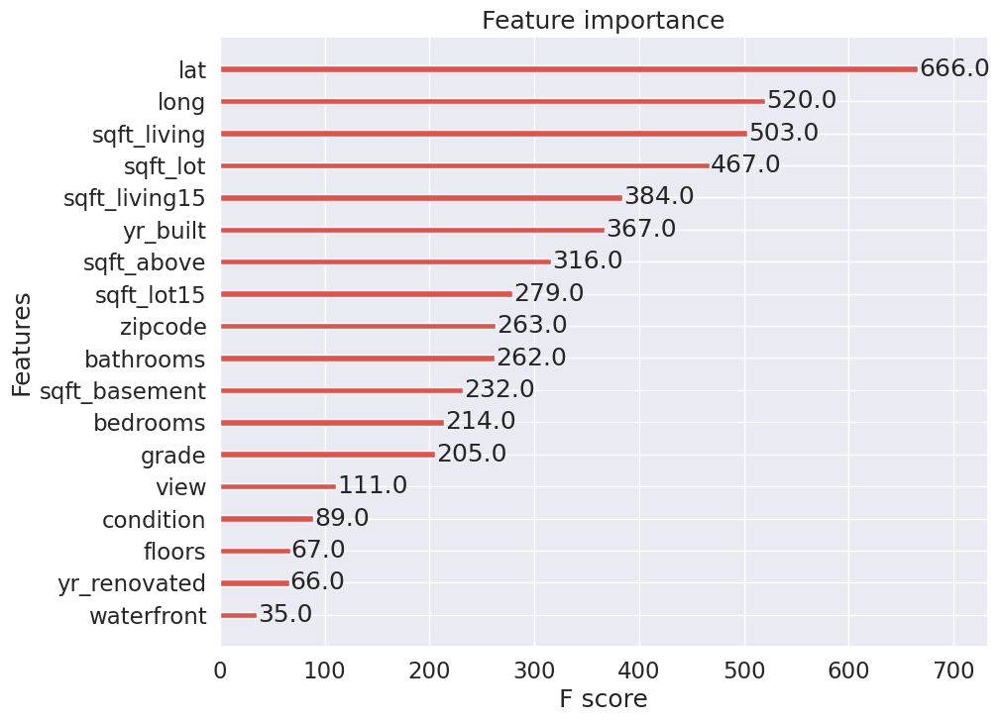

In [55]:
from xgboost import XGBRegressor
import xgboost as xgb

# Fit a random forest model using XGBoost
xgb_model = XGBRegressor()
xgb_model.fit(A, B)

# Plot the feature importances
fig, ax = plt.subplots(figsize=(10, 8))
xgb.plot_importance(xgb_model, ax=ax)
plt.show()

### **Using AutoML to find out the best Model**

In [56]:
#setting the run time, size and other params
min_mem_size=6 
run_time=222
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)      
  h2o.cluster().shutdown()
  sys.exit(2)

5
Checking whether there is an H2O instance running at http://localhost:52062..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp08eolf_3
  JVM stdout: /tmp/tmp08eolf_3/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp08eolf_3/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:52062
Connecting to H2O server at http://127.0.0.1:52062 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_66pso1
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [57]:
#importing the dataset
url = "https://github.com/mondalso/HouseSalesInKingCountry/blob/main/kc_house_data.csv?raw=true"
df = h2o.import_file(path = url)

# Create a 80/20 train/test split
pct_rows=0.80
df = df.drop(['id', 'date'], axis=1)
df_train, df_test = df.split_frame([pct_rows])
X=df.columns
y_numeric = 'price'
X.remove(y_numeric) 

# Set up AutoML
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)

#pass the data through H20AutoML
aml.train(x=X,y=y_numeric,training_frame=df_train) 

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),6/8
# GBM base models (used / total),4/4
# XGBoost base models (used / total),2/2
# DRF base models (used / total),0/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


In [58]:
print(aml.leaderboard)  # Leaderbord of AutoML output

model_id                                                  rmse          mse      mae     rmsle    mean_residual_deviance
StackedEnsemble_AllModels_1_AutoML_1_20230410_12855     125029  1.56322e+10  67196.7  0.168766               1.56322e+10
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_12855  125655  1.57891e+10  68608.1  0.172313               1.57891e+10
StackedEnsemble_AllModels_2_AutoML_1_20230410_12855     125797  1.5825e+10   67659.4  0.1694                 1.5825e+10
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_12855  125827  1.58323e+10  68975.8  0.172882               1.58323e+10
GBM_2_AutoML_1_20230410_12855                           129445  1.67561e+10  70478.5  0.176468               1.67561e+10
GBM_4_AutoML_1_20230410_12855                           130490  1.70275e+10  68554.2  0.171841               1.70275e+10
GBM_3_AutoML_1_20230410_12855                           131249  1.72262e+10  70735.1  0.177366               1.72262e+10
StackedEnsemble_BestOfFamily_1_Au

In [59]:
#assign index values to all the models generated
model_index=0
glm_index=0
glm_model=''
aml_leaderboard_df1=aml.leaderboard.as_data_frame()
models_dict={}
for m in aml_leaderboard_df1['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break 
  model_index=model_index+1  

for m in aml_leaderboard_df1['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break  
  glm_index=glm_index+1     
models_dict

{'StackedEnsemble_AllModels_1_AutoML_1_20230410_12855': 0,
 'StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_12855': 1,
 'StackedEnsemble_AllModels_2_AutoML_1_20230410_12855': 2,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_12855': 3,
 'GBM_2_AutoML_1_20230410_12855': 4,
 'GLM_1_AutoML_1_20230410_12855': 18}

In [60]:
#print the index value of best model
print(model_index)
best_model1 = h2o.get_model(aml.leaderboard[model_index,'model_id'])

4


In [61]:
#print best model name
best_model1.algo

'gbm'

In [62]:
best_model1

Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_2_AutoML_1_20230410_12855


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    59                 59                          45455                  7            7            7             18            104           56.4746

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 9093064245.71023
RMSE: 95357.55998194496
MAE: 59698.83503429723
RMSLE: 0.15861611389416788
Mean Residual Deviance: 9093064245.71023

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 16756058025.797676
RMSE: 129445.19313515538
MAE: 70478.50269472627
RMSLE: 0.17646847000296811
Mean Residual Deviance: 16756058025.797676

Cross-Validation Metrics Summary: 
                        mean         sd           cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  -----------  -----------  ------------  ------------  ------------  ------------  ------------
mae                     70478.5      2458.32      69266.6       69088.6       69326.4       74845.4       69865.4
mean_residual_deviance  1.67563e+10  3.86588e+09  1.39366e+10   1.31644e+10   1.48029e+10   2.06887e+10   2.11889e+10
mse                     1.67563e+10  3.86588e+09  1.39366e+10   1.31644e+10   1.48029e+10   2.06887e+10   2.11889e+10
r2                      0.878939     0.01474      0.88723       0.895881      0.88449       0.86147       0.865624
residual_deviance       1.67563e+10  3.86588e+09  1.39366e+10   1.31644e+10   1.48029e+10   2.06887e+10   2.11889e+10
rmse                    128771       14758.5      118053        114736        121667        143836        145564
rmsle                   0.176436     0.00379091   0.177409      0.175109      0.179543      0.179604      0.170513

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2023-04-10 01:31:26  13.689 sec  0                  370211           235235          1.37056e+11
    2023-04-10 01:31:27  13.967 sec  5                  258201           162761          6.66676e+10
    2023-04-10 01:31:27  14.192 sec  10                 190576           116286          3.63192e+10
    2023-04-10 01:31:27  14.345 sec  15                 151552           91520.6         2.29681e+10
    2023-04-10 01:31:27  14.473 sec  20                 129808           78076.2         1.68501e+10
    2023-04-10 01:31:27  14.621 sec  25                 117154           70371           1.37251e+10
    2023-04-10 01:31:28  14.766 sec  30                 108585           65795.2         1.17906e+10
    2023-04-10 01:31:28  14.891 sec  35                 103864           63458.1         1.07877e+10
    2023-04-10 01:31:28  15.088 sec  40                 101234           62275.8         1.02482e+10
    2023-04-10 01:31:28  15.267 sec  45                 99685            61675           9.9371e+09
    2023-04-10 01:31:28  15.445 sec  50                 97972.3          60856.2         9.59856e+09
    2023-04-10 01:31:28  15.570 sec  55                 96278            60039.7         9.26946e+09
    2023-04-10 01:31:28  15.683 sec  59                 95357.6          59698.8         9.09306e+09

Variable Importances: 
variable       relative_importance    scaled_importance    percentage
-------------  ---------------------  -------------------  ------------
grade          4.15401e+15            1                    0.402424
sqft_living    1.85682e+15            0.446994             0.179881
lat            1.26224e+15            0.303862        

In [63]:
#fit the data to the best model
autoML_best_predictions = best_model1.predict(df_test).round()

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [64]:
autoMLpredictions = h2o.as_list(autoML_best_predictions, use_pandas=False)
y_test_h2O = h2o.as_list(df_test["price"], use_pandas=False)

In [65]:
def flatten(t):
    listt = [(item) for sublist in t for item in sublist][1:]
    listt = [float(x) for x in listt]
    x = pd.Series(listt)
    return x

In [66]:
autoMLpredictions = flatten(autoMLpredictions)
y_test_h2O = flatten(y_test_h2O)

## Hyperparameter Tuning of AutoML's Best Model

In [67]:
train, validate, test = np.split(
    data.sample(frac=1, random_state=42),
    [int(0.6 * len(df)), int(0.8 * len(df))],
)
train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

drf_hyper_params = {
    "ntrees": [10, 25, 50, 75, 100],
    "max_depth": [5, 7, 10, 14],
    "sample_rate": [0.25, 0.5, 0.75, 1.0],
}

search_criteria = {"strategy": "RandomDiscrete", "max_models": 100, "seed": 1}

gbm_grid2 = H2OGridSearch(
    model=H2ORandomForestEstimator,
    grid_id="gbm_grid2",
    hyper_params=drf_hyper_params,
    search_criteria=search_criteria,
)

gbm_grid2.train(
    x=X,
    y="price",
    training_frame=train,
    validation_frame=validate,
    seed=1,
)


def find_best_model_from_grid(h2o_grid, test_parameter):
    model_list = []
    for grid_item in h2o_grid:
        if test_parameter is "r2":
            if not (grid_item.r2() == "NaN"):
                model_list.append(grid_item.r2())
            else:
                model_list.append(0.0)
        elif test_parameter is "auc":
            if not (grid_item.auc() == "NaN"):
                model_list.append(grid_item.auc())
            else:
                model_list.append(0.0)
    max_index = model_list.index(max(model_list))
    best_model = h2o_grid[max_index]
    print("Model ID with best R2: " + best_model.model_id)
    if test_parameter is "r2":
        print("Best R2: " + str(best_model.r2()))
    elif test_parameter is "auc":
        print("Best AUC: " + str(best_model.auc()))
    return best_model


best_drf_model = find_best_model_from_grid(gbm_grid2, "r2")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
drf Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%
Model ID with best R2: gbm_grid2_model_7
Best R2: 0.8557474808930882


### **What evaluation metric are you using?**

The evaluation metrics which I am using are

*    Mean Squared Error
*    Root Mean Squared Error
*    Mean Absolute Error
*    Mean Residual Deviance
*    Accuracy

These evaluation metrics are used to evaluate the best model, as it is a regression problem. Here, Mean Residual Deviance and Accuracy are the most important metrics used to evaluate the mode.

The residual deviance tells us how well the response variable can be predicted by a model with p predictor variables. The lower the value, the better the model is able to predict the value of the response variable.

Accuracy tells us how correct and precise our model is.

In [68]:
best_drf_model

,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
,100.0,100.0,2721061.0,14.0,14.0,14.0,1697.0,2546.0,2161.86
,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
,2023-04-10 01:33:16,32.475 sec,0.0,nan,nan,nan,nan,nan,nan
,2023-04-10 01:33:17,32.646 sec,1.0,244859.3607721,110647.4140467,59956106557.7220612,192227.9377173,107145.5978523,36951580039.0415726
,2023-04-10 01:33:17,32.803 sec,2.0,221156.0119198,104102.3604393,48909981608.2844238,154537.8620919,89463.2674476,23881950819.9299583
,2023-04-10 01:33:17,32.931 sec,3.0,200216.0969748,99290.9574994,40086485487.8194275,146549.3792960,83216.8937520,21476720572.0442238
,2023-04-10 01:33:17,33.065 sec,4.0,190542.4697823,94968.2218726,36306432790.7403259,138729.0450607,79182.8208488,19245747943.4564857
,2023-04-10 01:33:17,33.206 sec,5.0,176217.4728897,91342.1871417,31052597751.6224899,137237.7903720,77936.5818113,18834211106.1887093
,2023-04-10 01:33:17,33.339 sec,6.0,173951.7433276,89880.6678730,30259209006.7062263,132853.0792068,76530.3321861,17649940654.7319641
,2023-04-10 01:33:17,33.494 sec,7.0,169700.5552872,87630.6929050,28798278464.7897491,131989.7657875,75867.2161045,17421298272.6276436


In [69]:
# Evaluating the model on Test Data
autoML_best_predictions_2 = best_drf_model.predict(df_test).round()
autoMLpredictions_2 = h2o.as_list(autoML_best_predictions_2, use_pandas=False)
y_test_h2O_2 = h2o.as_list(df_test["price"], use_pandas=False)
autoMLpredictions_2 = flatten(autoMLpredictions_2)
y_test_h2O_2 = flatten(y_test_h2O_2)

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

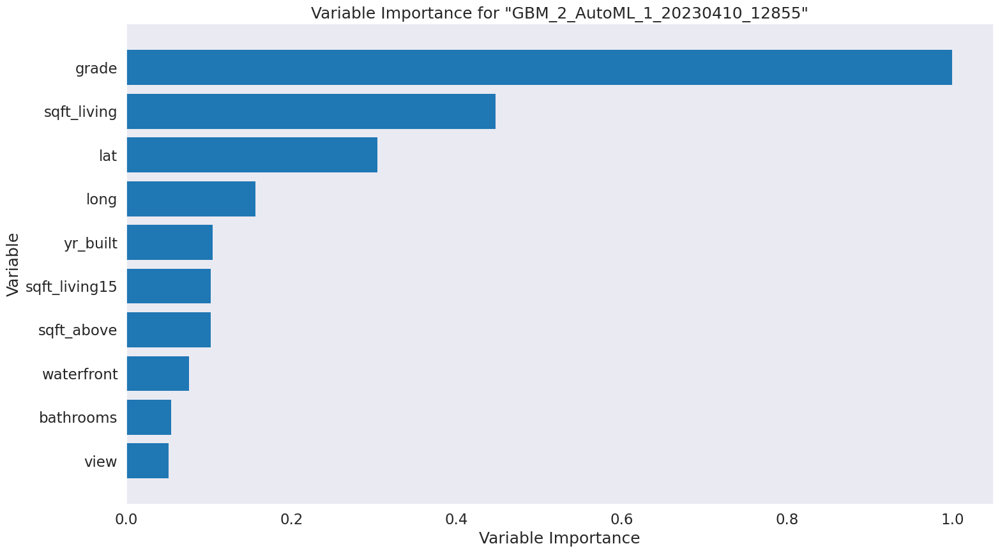

In [70]:
explain_model = aml.explain(frame = df_test,include_explanations=['varimp'])

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

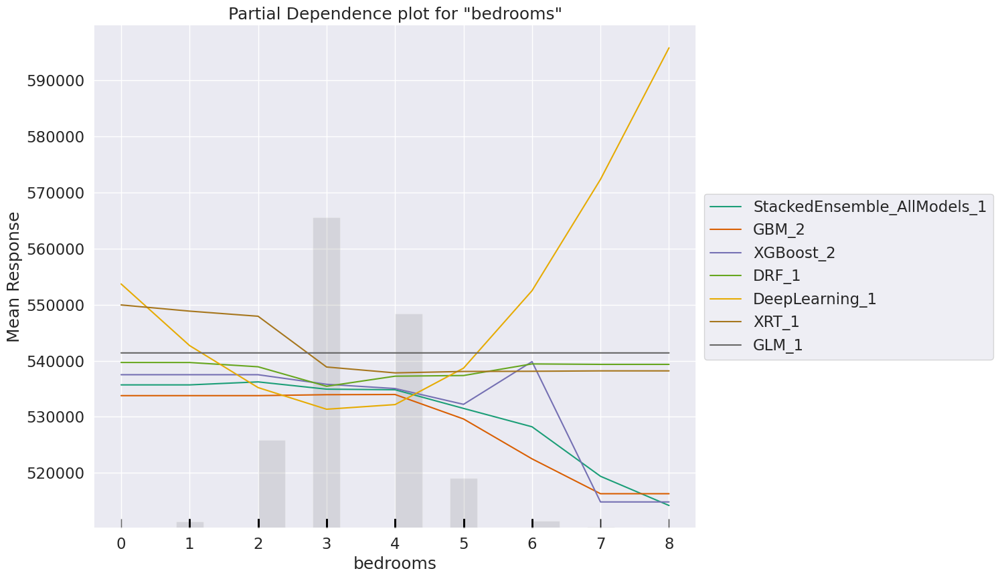

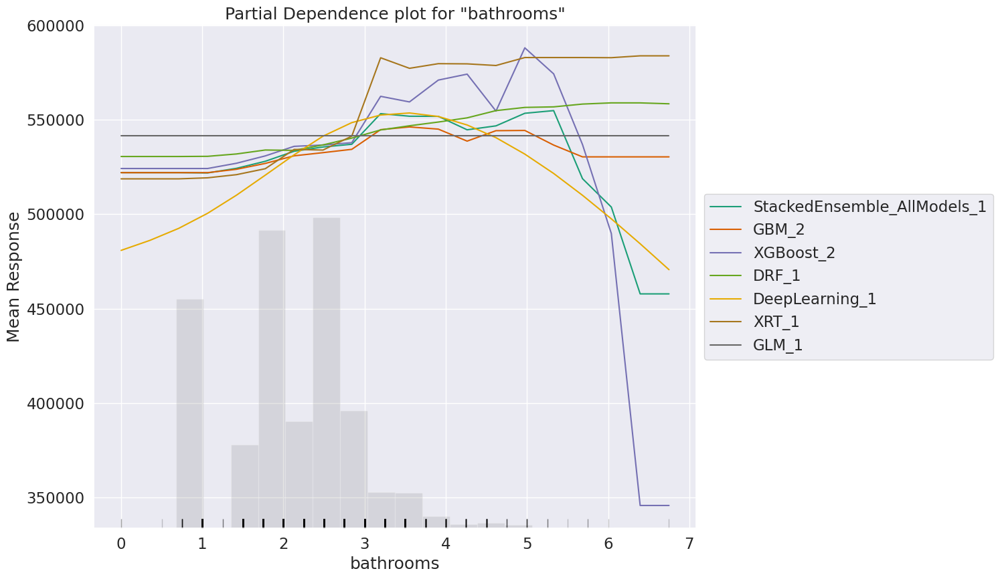

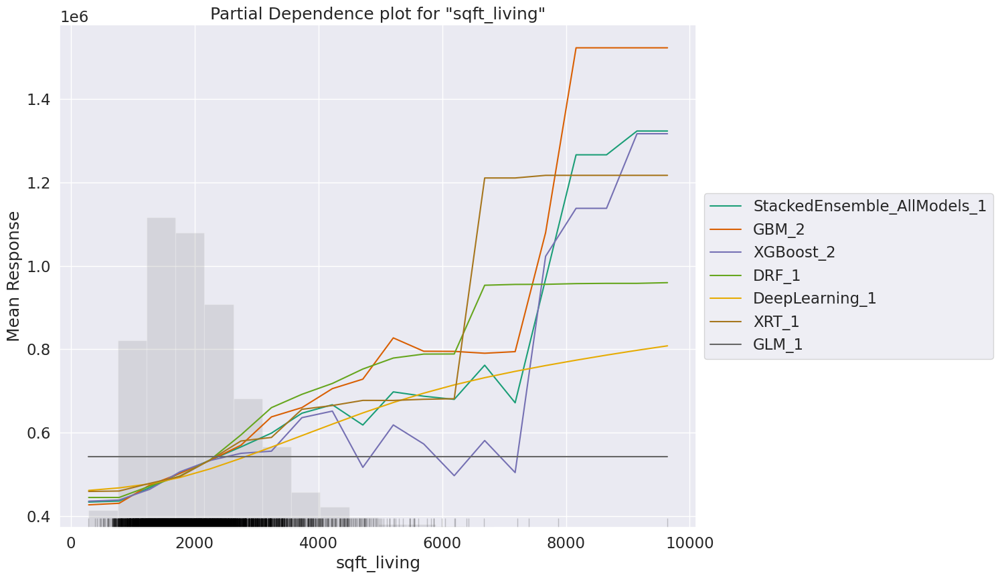

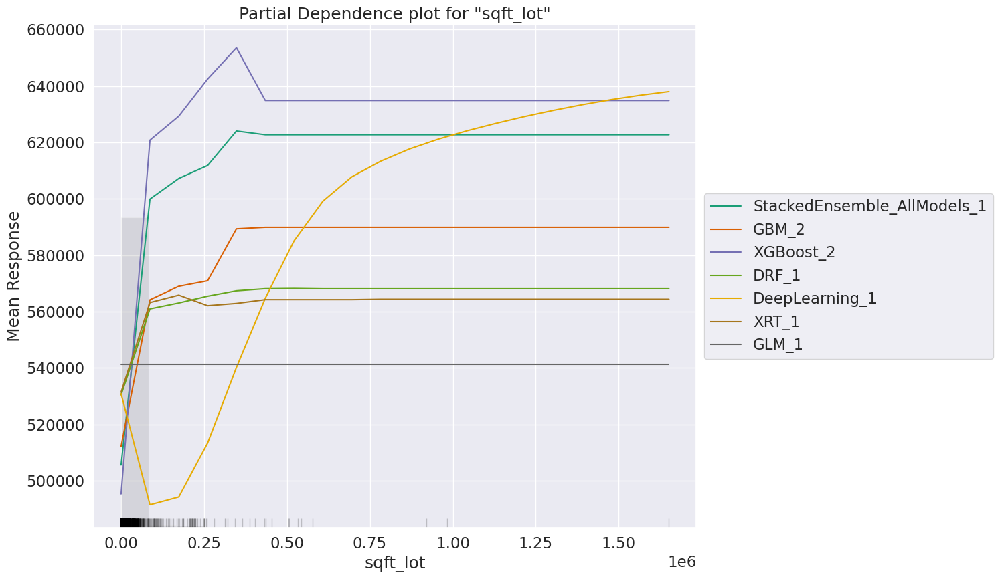

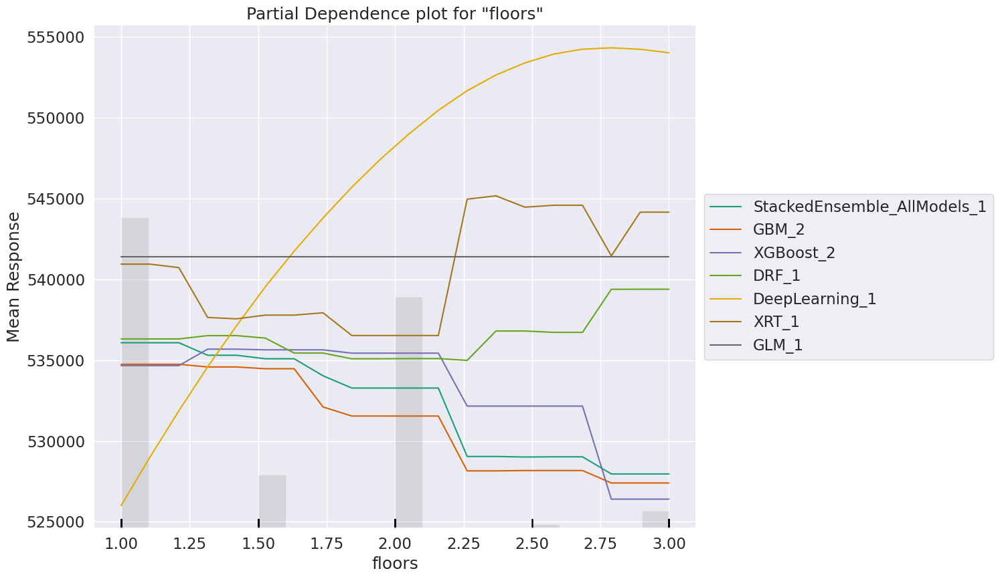

...

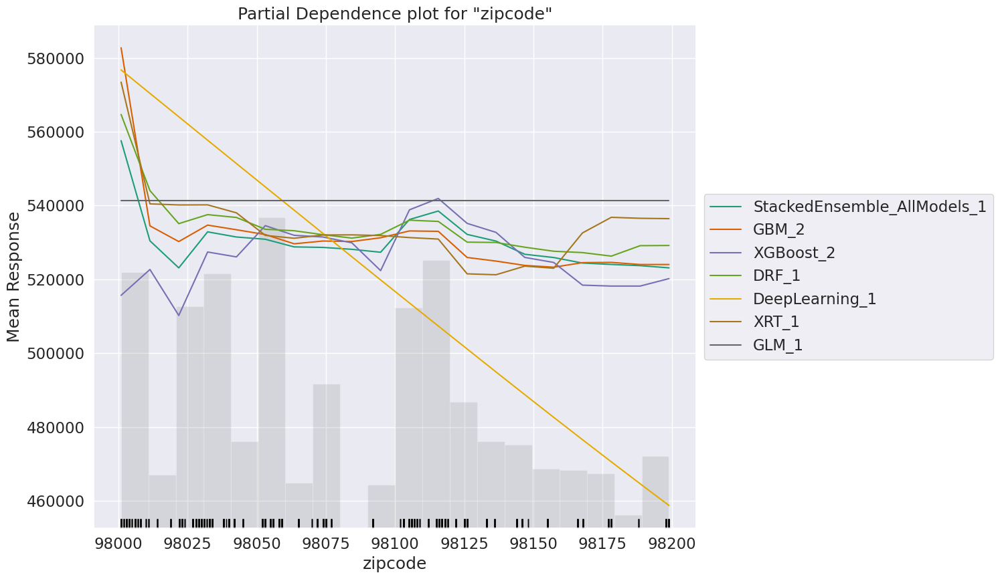

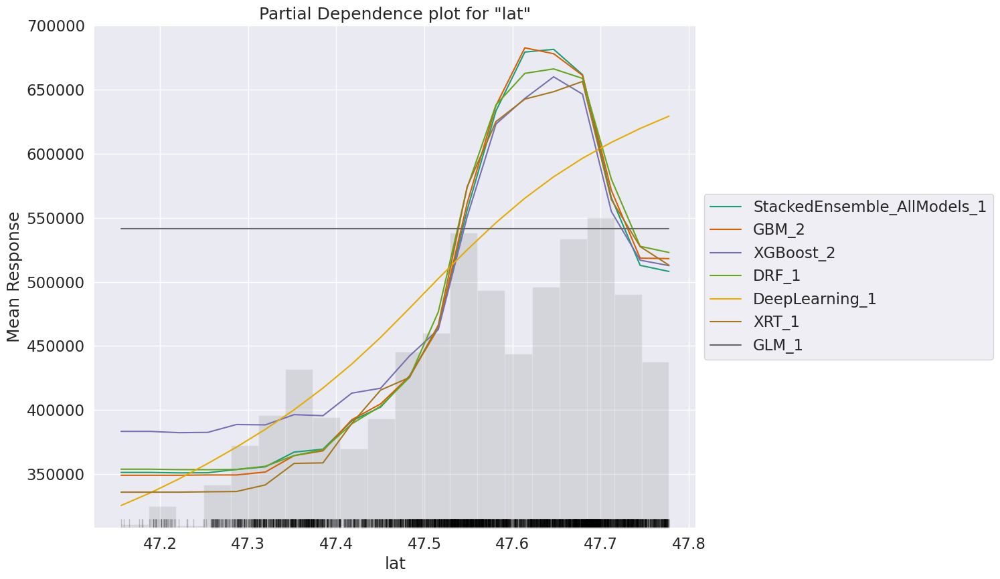

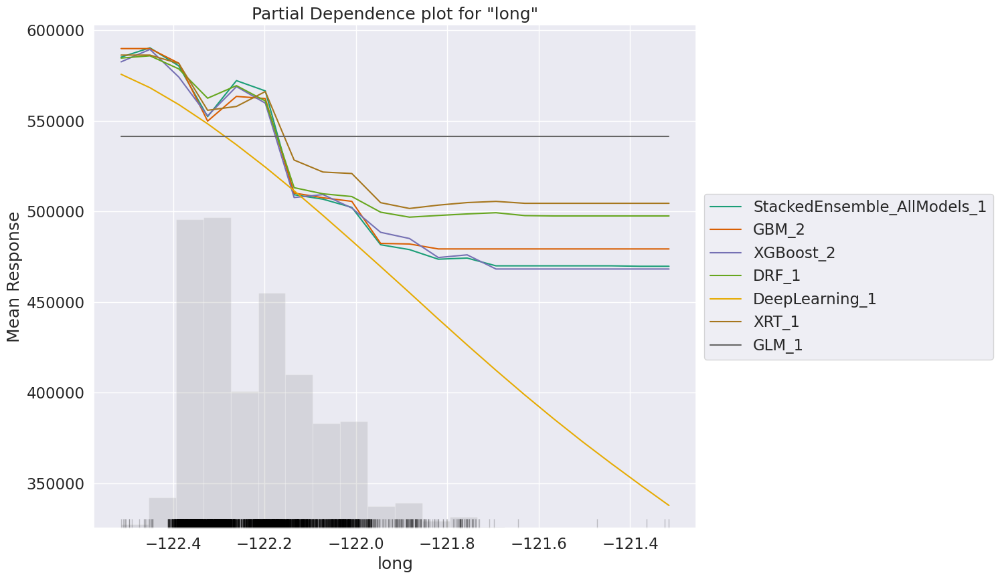

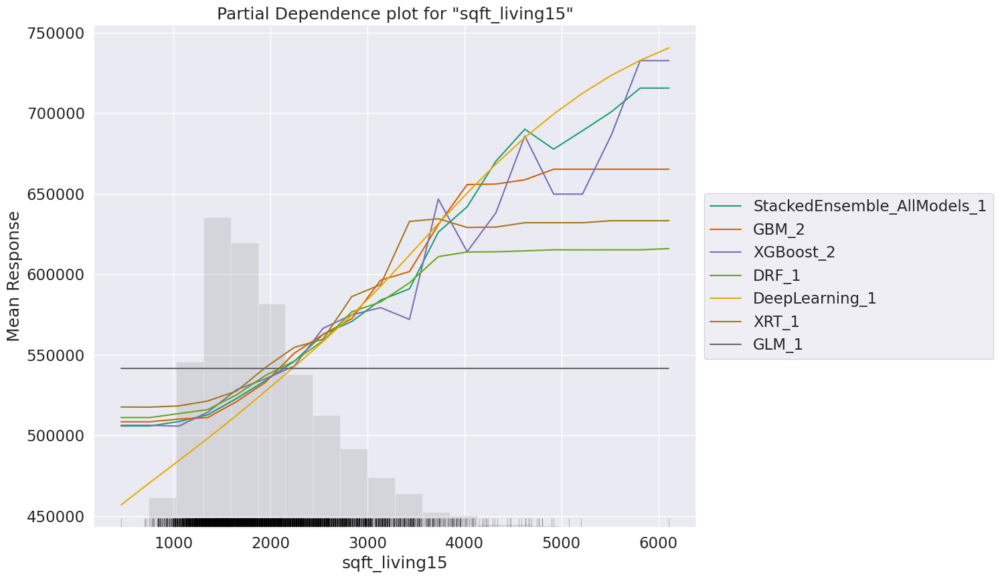

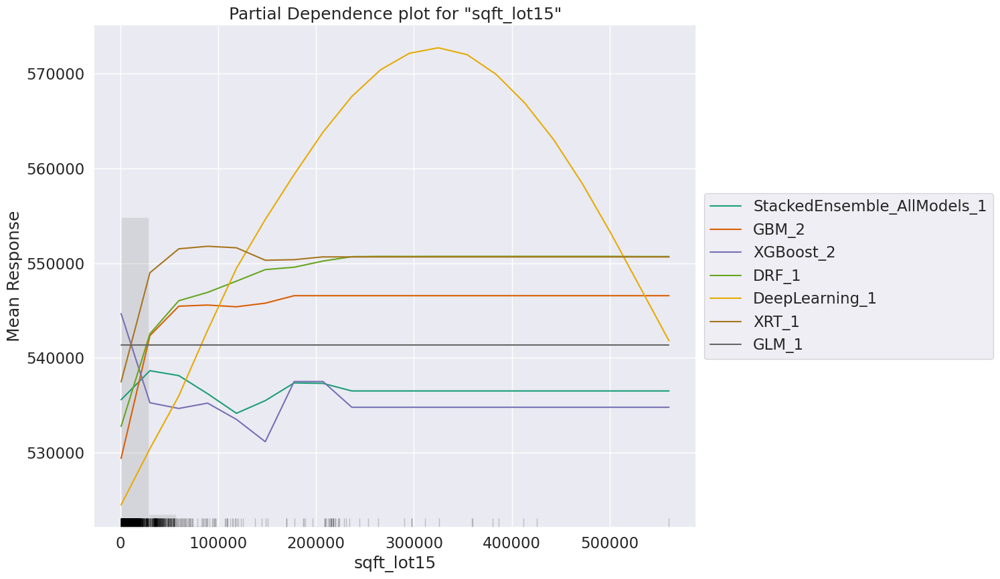

In [71]:
explain_model = aml.explain(frame = df_test,include_explanations=['pdp'])

### **Which models did you explore and did you try to tune the hyperparameters of the best model you got?**

Multiple models were trained for this purpose including the simplest Linear Regression to using AutoML to get the best model it could fit. The models I trained for this purpose were

*    Linear Regressor
*    Random Forest Regressor
*    Decision Tree Regressor
*    AutoML
*    AutoML with Hypertuning parameters

The models which gave me the best performance in predicting the price of houses were the Decision Tree Model and the Hypertuning parametered model from AutoML. The model from AutoML to give the best result was a Distributed Random Forest Regressor.

As the AutoML's model was promising, I tuned its hyperparameters to oprimize the model. Tunining the hyperparameters helped the model to incease its accuracy from 86.94% to 88.91% which is a great increase in the performance.

In [72]:
print(
    "Accuracy of predicting the correct price of house using Linear Model = ",
    100 - percentage_change(y_test, y_linear_predictions),
)
print(
    "Accuracy of predicting the correct price of house using Decision Tree Model = ",
    100 - percentage_change(y_test, y_tree_based_predictions1),
)
print(
    "Accuracy of predicting the correct price of house using Random Forest Model = ",
    100 - percentage_change(y_test, y_tree_based_predictions2),
)
print(
    "Accuracy of predicting the correct price of house using best AutoML model = ",
    100 - percentage_change(y_test_h2O, autoMLpredictions),
)
print(
    "Accuracy of predicting the correct price of house using best AutoML model with Tuned Hyper-Parameters = ",
    100 - percentage_change(y_test_h2O_2, autoMLpredictions_2),
)

Accuracy of predicting the correct price of house using Linear Model =  74.33156286727544
Accuracy of predicting the correct price of house using Decision Tree Model =  99.63763961132415
Accuracy of predicting the correct price of house using Random Forest Model =  86.10432976173557
Accuracy of predicting the correct price of house using best AutoML model =  86.94876392970848
Accuracy of predicting the correct price of house using best AutoML model with Tuned Hyper-Parameters =  88.91135122289224


## **Model Selection**

From the above summary of the models trained on the dataset, the two best models are Decision Tree and AutoML's best model with tuned hyperparameters.

Decision Tree Regressor with an Accuracy of ~ 99.63%
AutoML's Hyperparameter Tuned Version ~ 88.91%
Let's try to understand how both the models have been trained.


### **Interpreting SVM Regressor using SHAP values**

Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

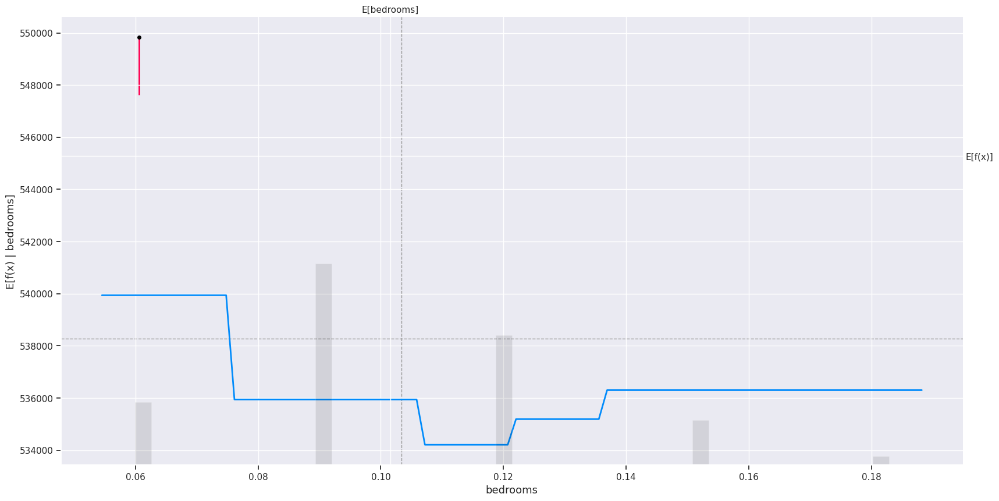

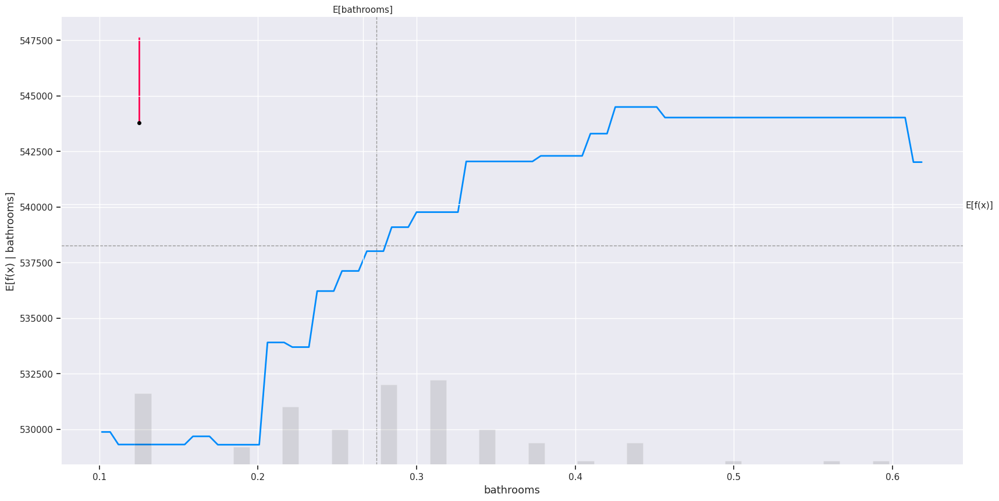

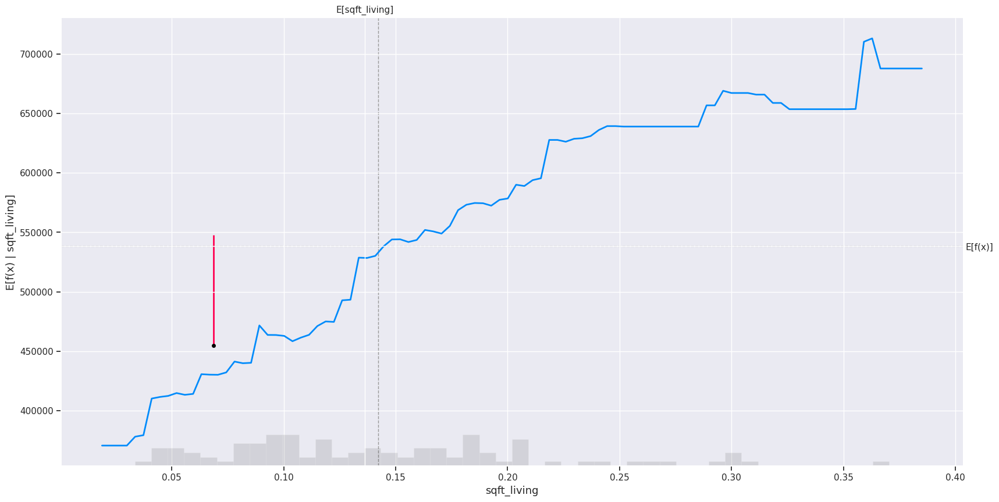

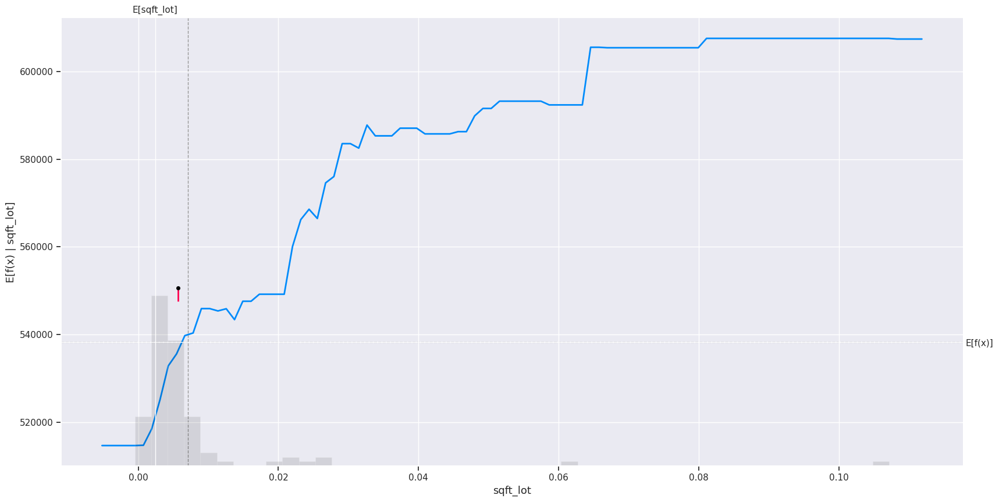

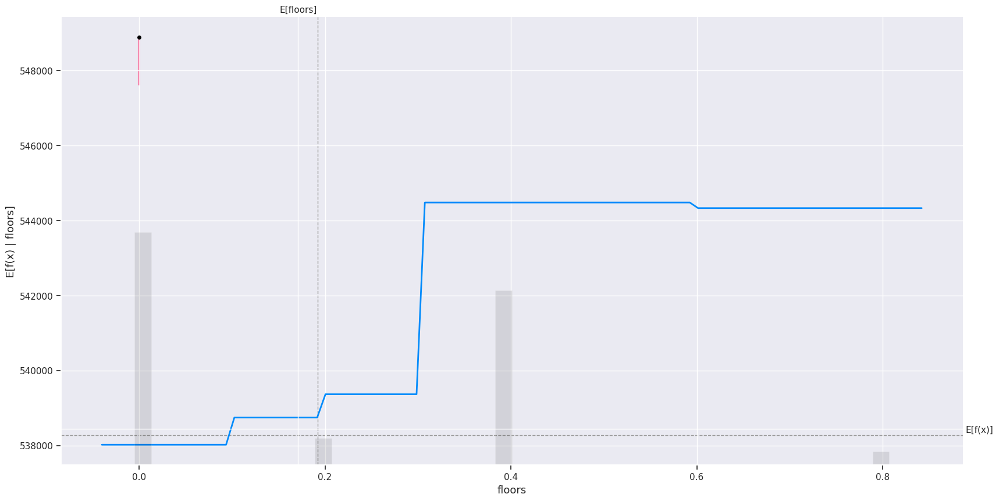

...

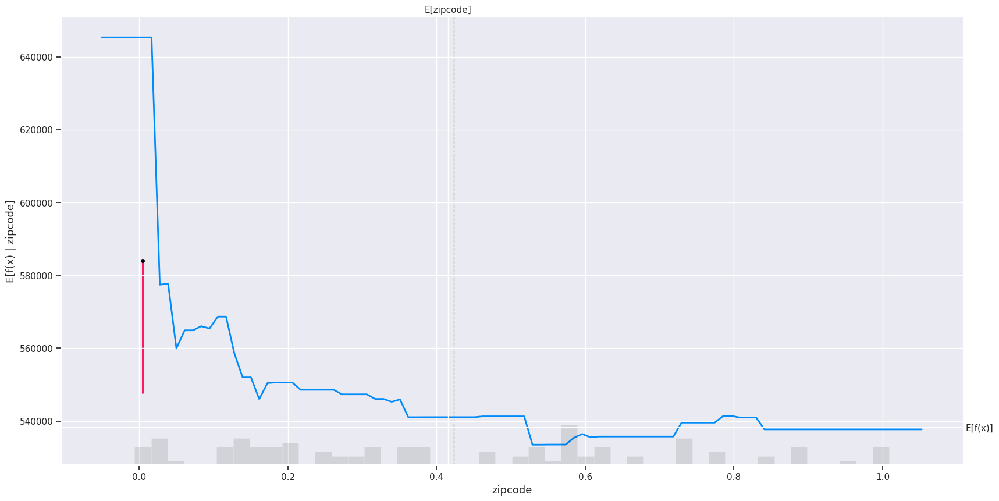

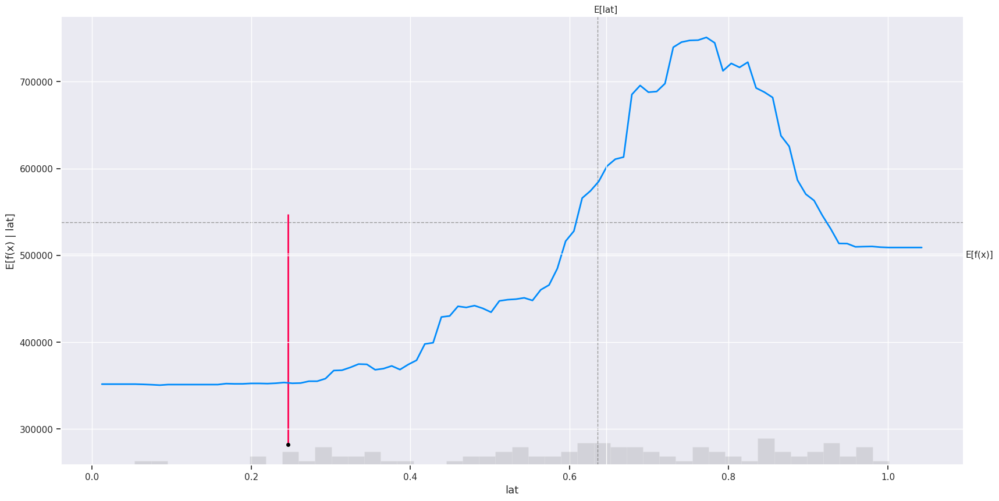

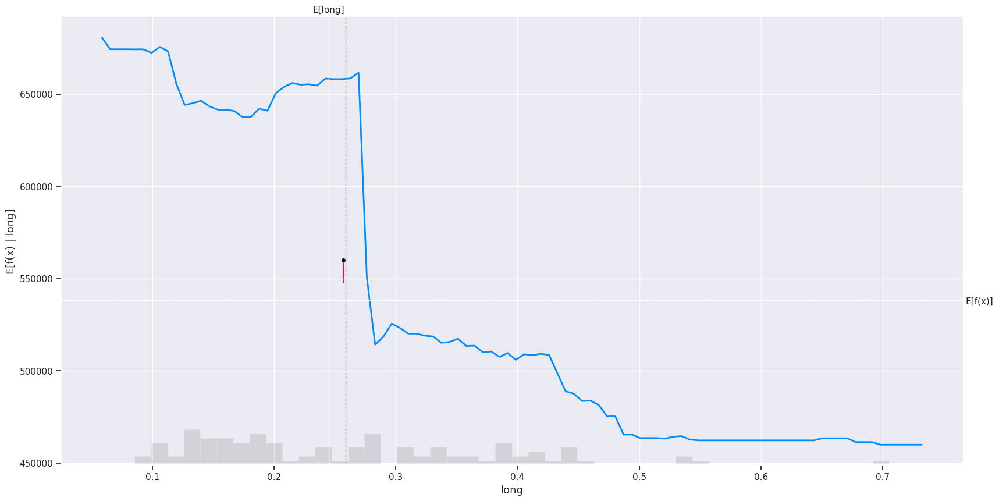

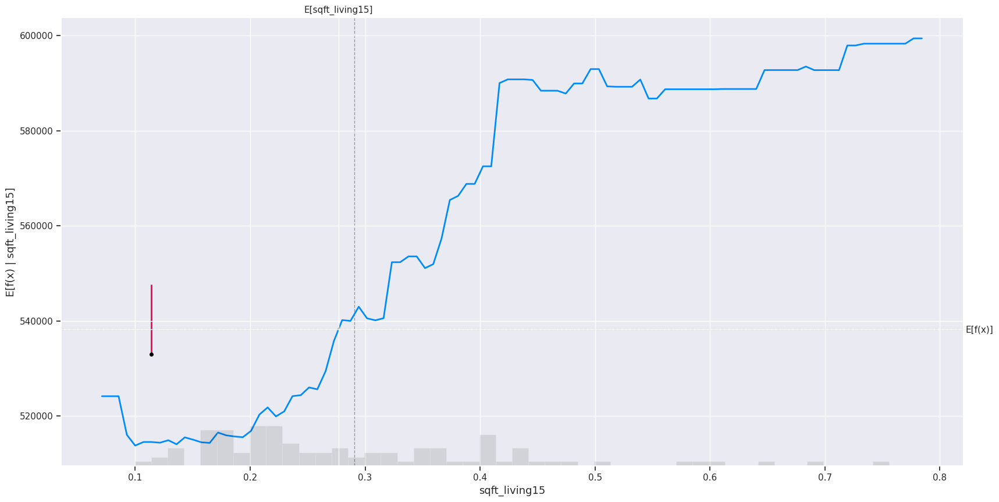

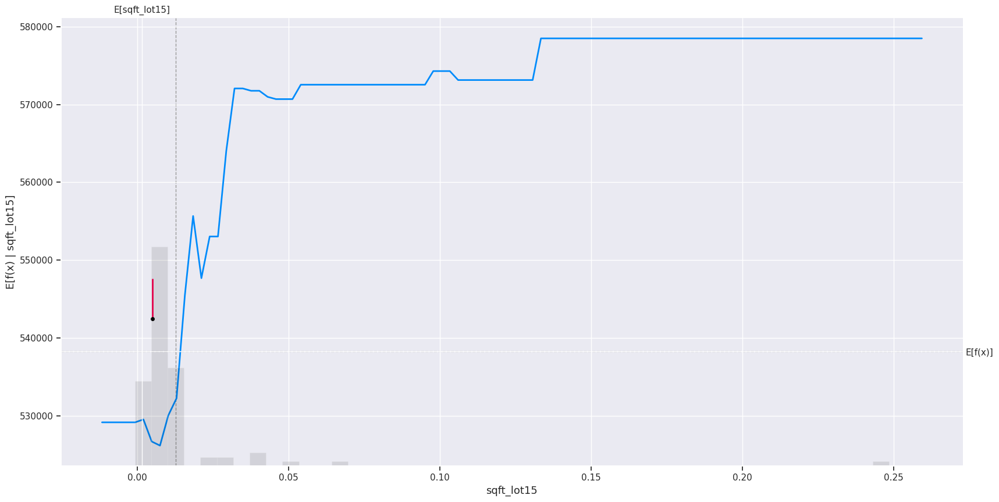

In [74]:
for i in x_train_100.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model1.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=shap_values_tree[sample_ind : sample_ind + 1, :],
    )

### **Interpreting SHAP Feature Importance Plot for Linear and Tree-based model**

The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important. Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

SHAP feature importance plot for SVM model
Using the below plot we can come on the conclusion that the lat is the most important feature, followed by sqft_living and grade.

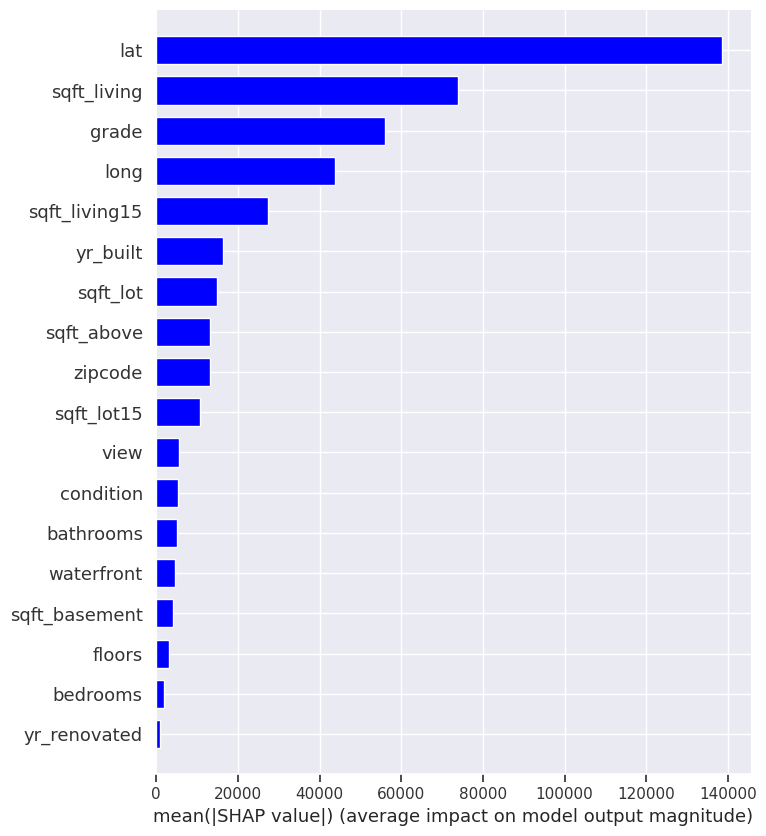

In [75]:
# SHAP variable importance for a Linear Model
shap.summary_plot(shap_values_tree, x_train, plot_type="bar", color="blue")

### **Interpreting Waterfall SHAP visualization**

Let's consider the same sample (sample_ind = 36).
It says that **f(x) = 550000** is what we got as a model output and the **expected output** for this sample was **547624**. We came pretty close to determining it as the difference is not much. The waterfall model explains how we got the expected output, and which features contributed to what. The graph shows that **yr_built has the biggest and most positive impact** in increasing the price of the house by 126154 for this specific sample. Followed by **grade that had a negative impact** and it bought the price of the house down again by 60130 for this sample, and so on. Using this model we can visually interpret why exactly this specific sample is giving an output of 547624.

In [109]:
# Waterfall plot for decision tree model
def get_SHAP(index=36):
    shap.plots.waterfall(shap_values_tree[index], max_display=14)


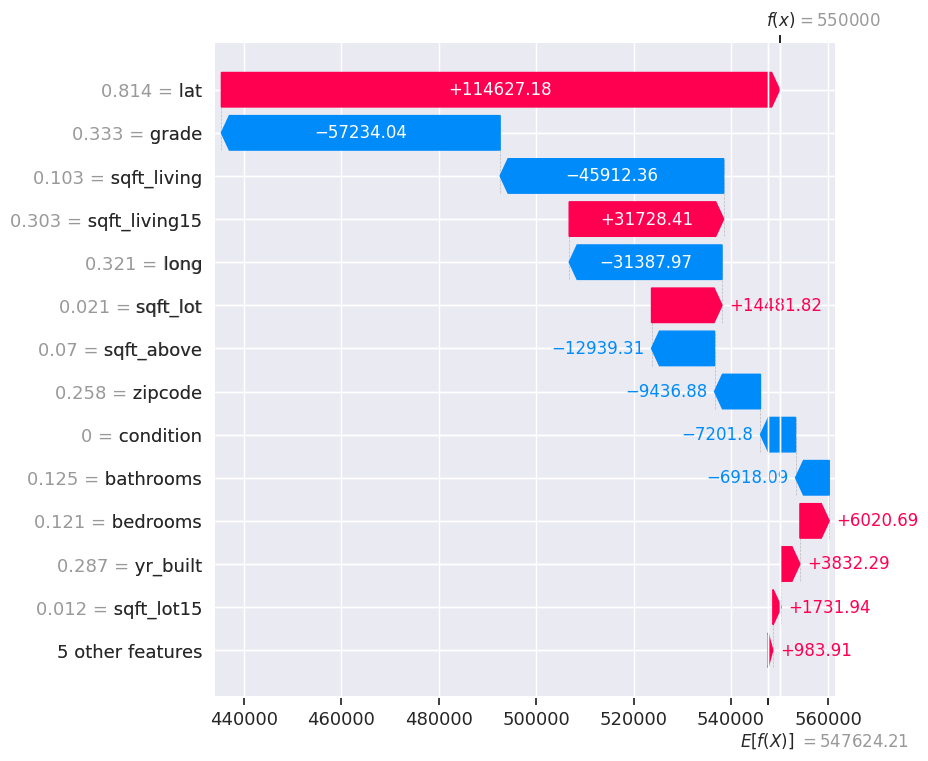

In [110]:
get_SHAP()

### **Interpret the summary plot SVM Model**
Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

This graph displays the importance of various features in an ML model for predicting housing prices.

*    Each dot on the chart represents a housing feature
*    Features are listed in descending order of importance
*    Red indicating high values
*    Blue indicating low values
*    If a dot is on the right side of the y-axis, it had a positive impact
*    If a dot is on the left side of the y-axis indicated a negative impact.
*    The position of a dot on the x-axis represents the intensity of impact, with greater distance indicating greater intensity.

This type of visualization is helpful in interpreting how the ML model is functioning and which features are the most important for predicting housing prices.

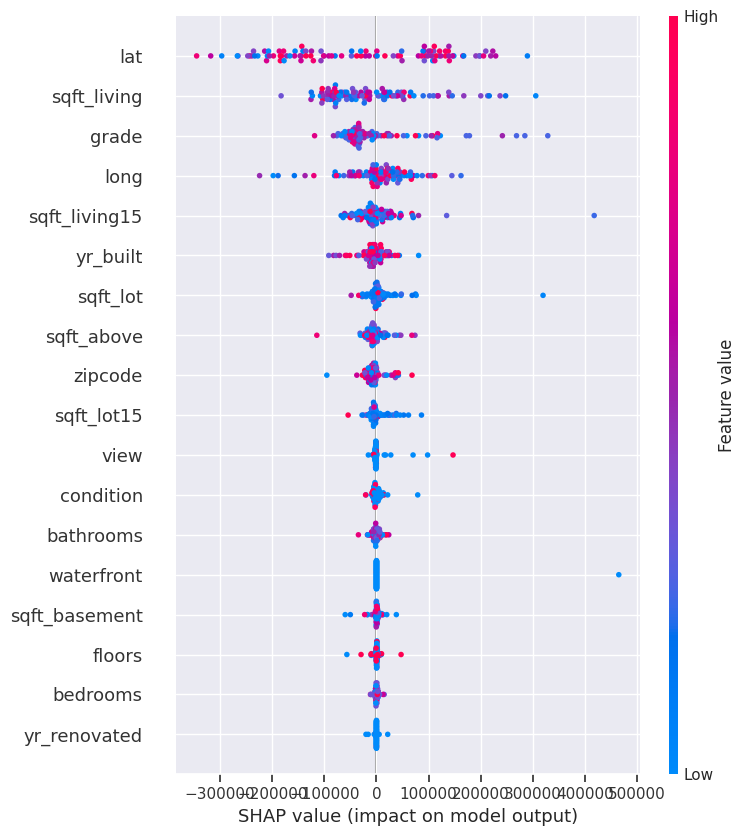

In [78]:
# SHAP summary for Linear Model
shap.summary_plot(shap_values_tree, x_train_100)

Some findings from the chart include:

*    higher the grade, higher will the price be
*    lower the yr_built, higher will the price be
*    higher the latitude, higher will the price be
*    lower the longitude, higher will the price be

### **Heatmap Visualization for Linear and Tree-based model**



This visualization is a summarization of the entire dataset on how each data point in every feature is affecting the target(quality of wine).
Here the Y-axis is Features
and X-axis is Instance of that feature
The color of the instance defines if it had a positive effect or negative effect by its color. If the instance is red then it had a positive effect and if the instance is blue then it had a negative effect
The intensity of the color is directly proportional to the intensity of the effect. Deeper the color, the more impactful the feature is

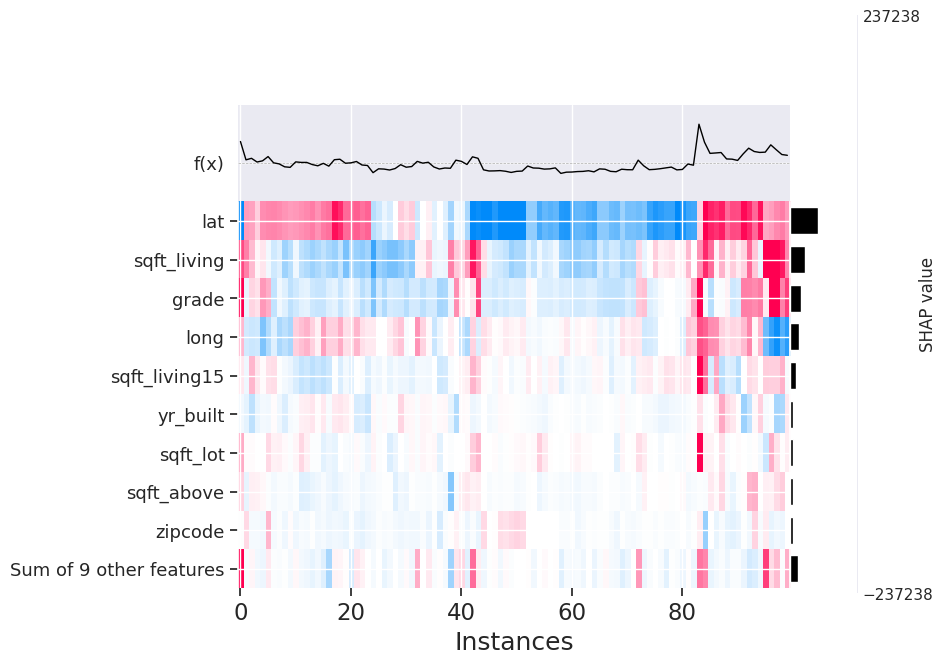

In [80]:
shap.plots.heatmap(shap_values_tree)  # SHAP HeatMap of a Tree Based Model

### **Partial Dependency Plots**

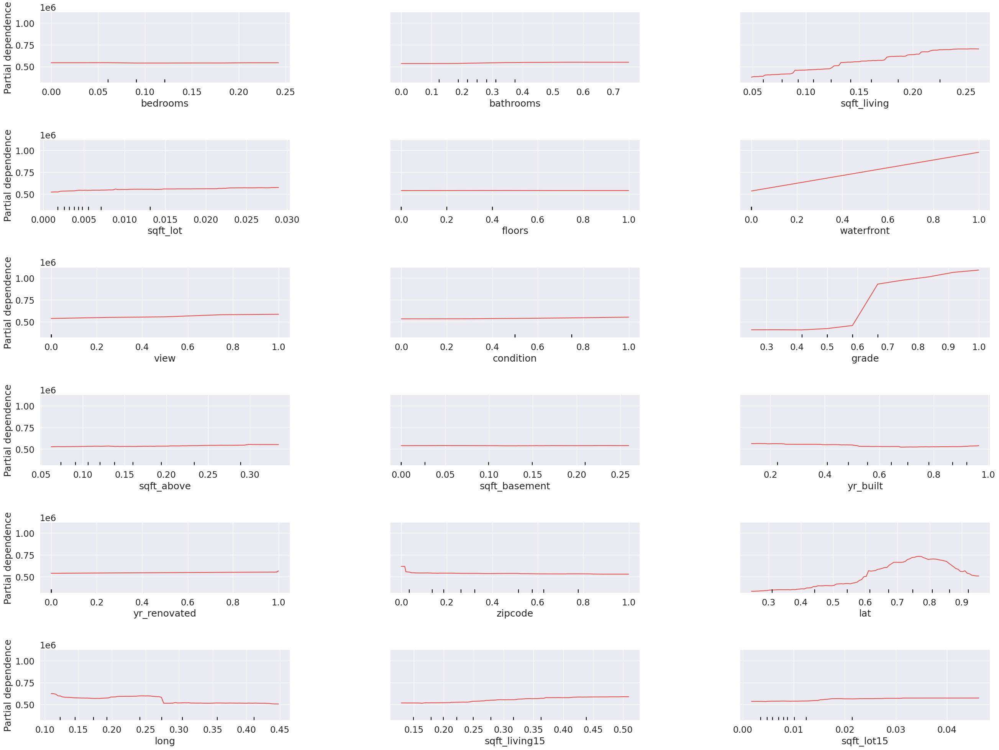

In [103]:
from matplotlib import pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

# Create and plot the data
disp1 = PartialDependenceDisplay.from_estimator(tree_model1, x_test, x_test.columns)
fig = plt.gcf()
plt.rcParams["figure.figsize"] = (20, 10)
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.rcParams["figure.figsize"] = (32, 24)
plt.show()

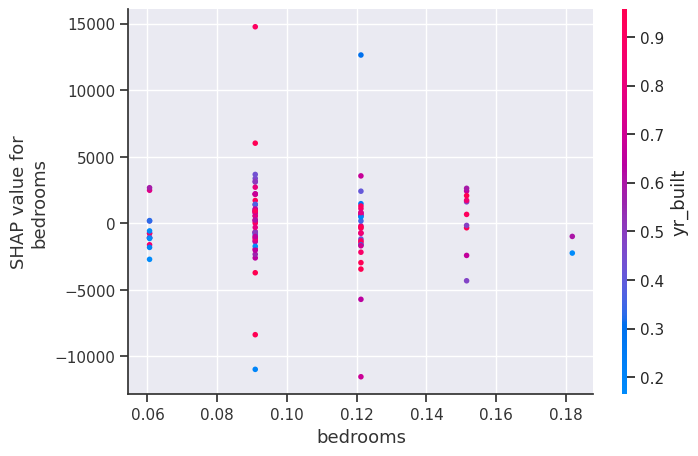

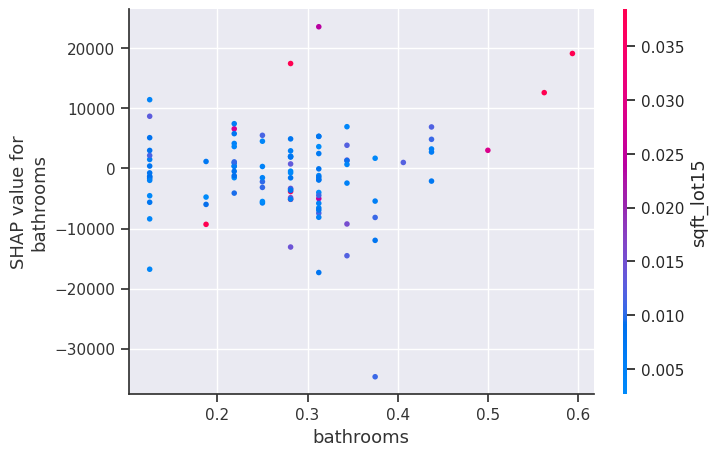

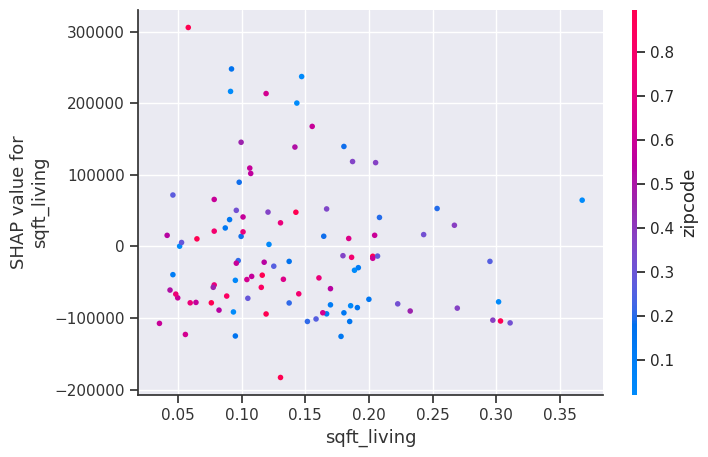

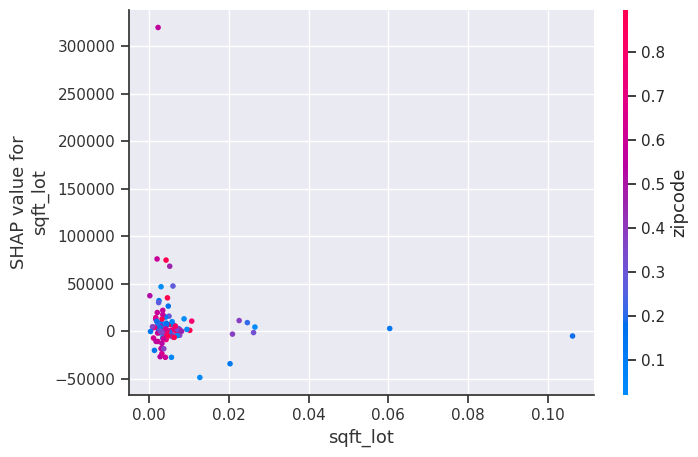

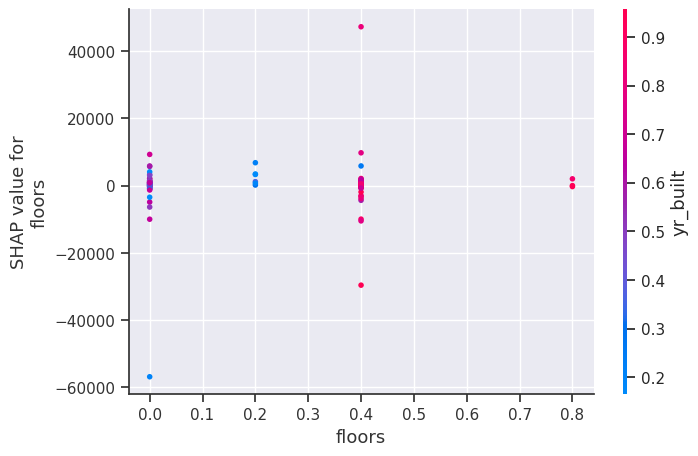

...

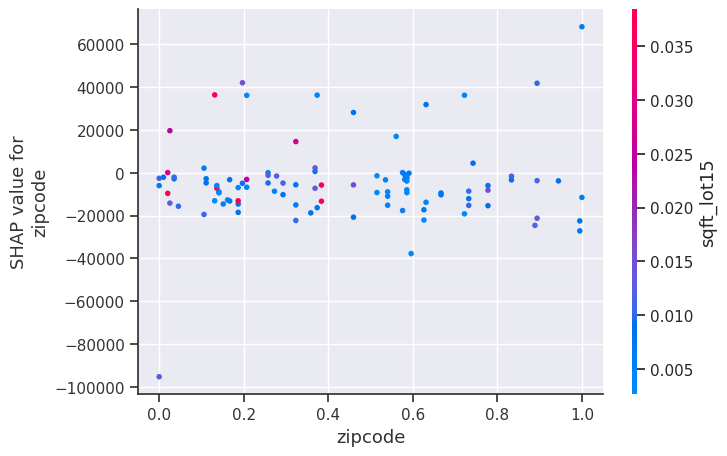

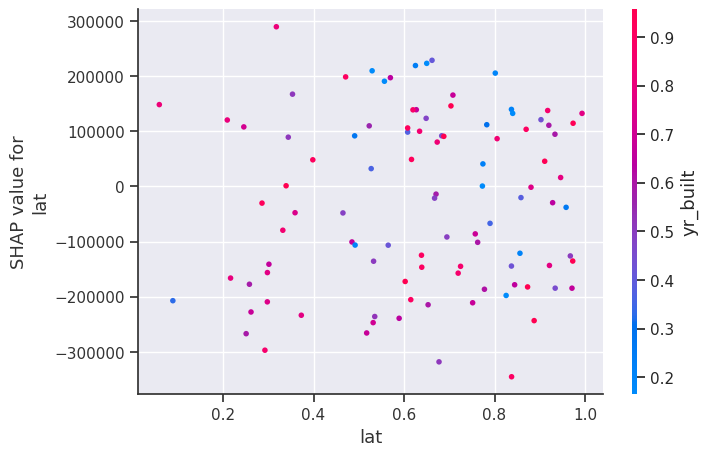

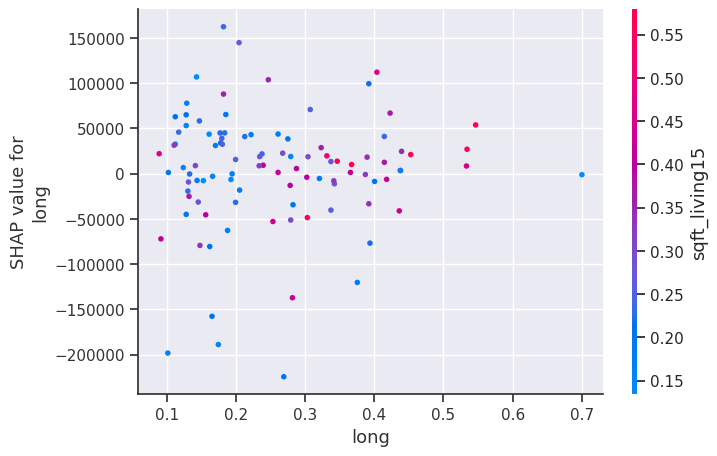

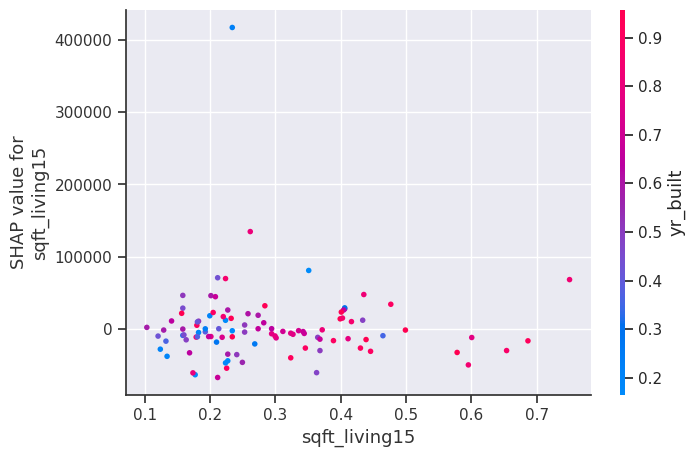

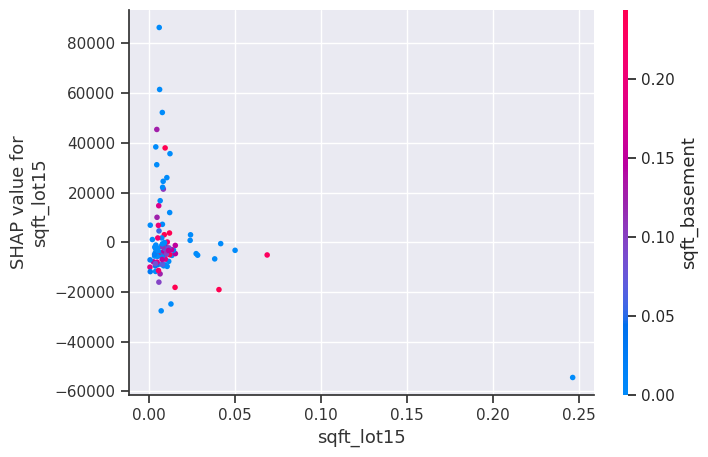

In [79]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, shap_values_tree.values, x_train_100)

## **Interpreting AutoML's best model with tuned hyperparameters**

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

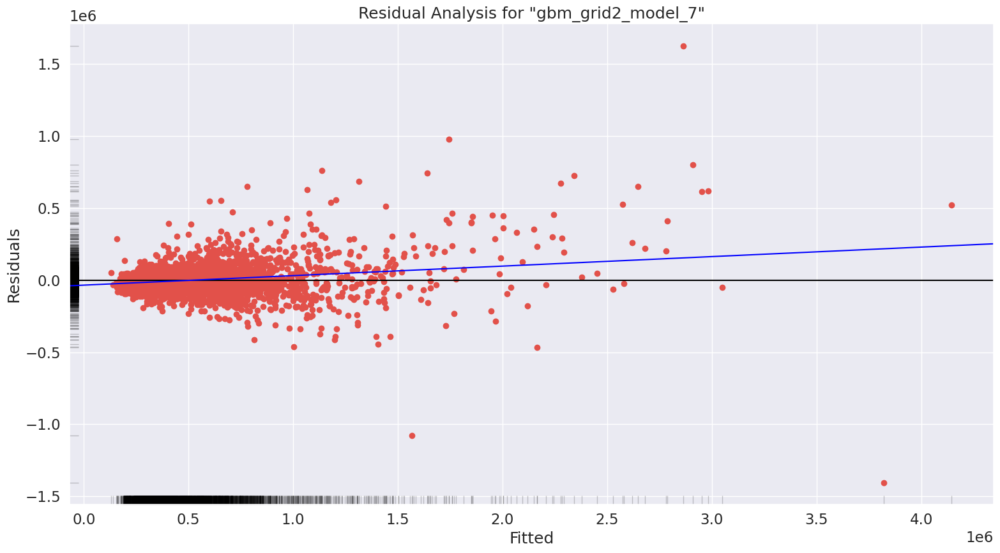

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

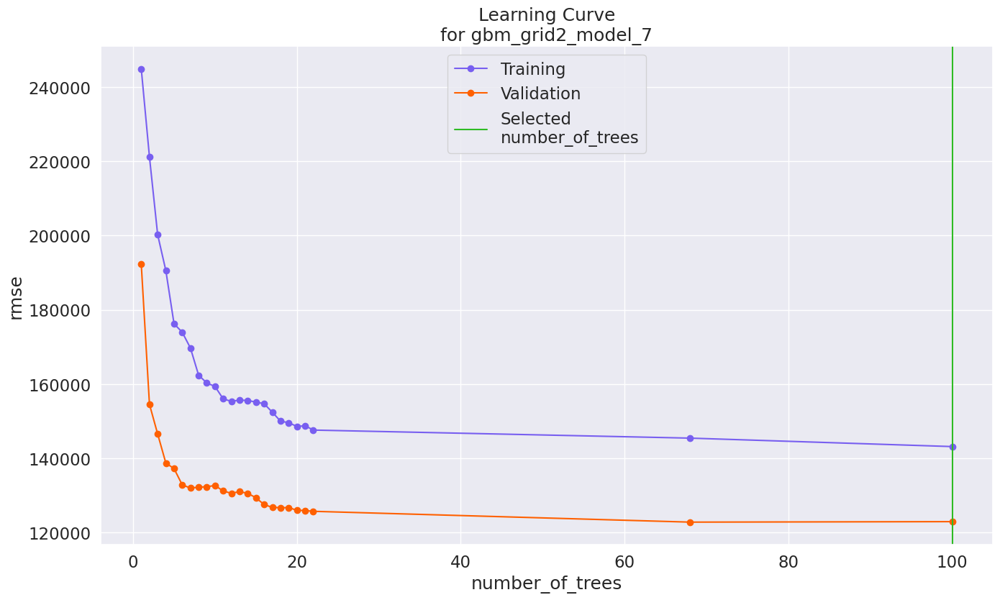

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

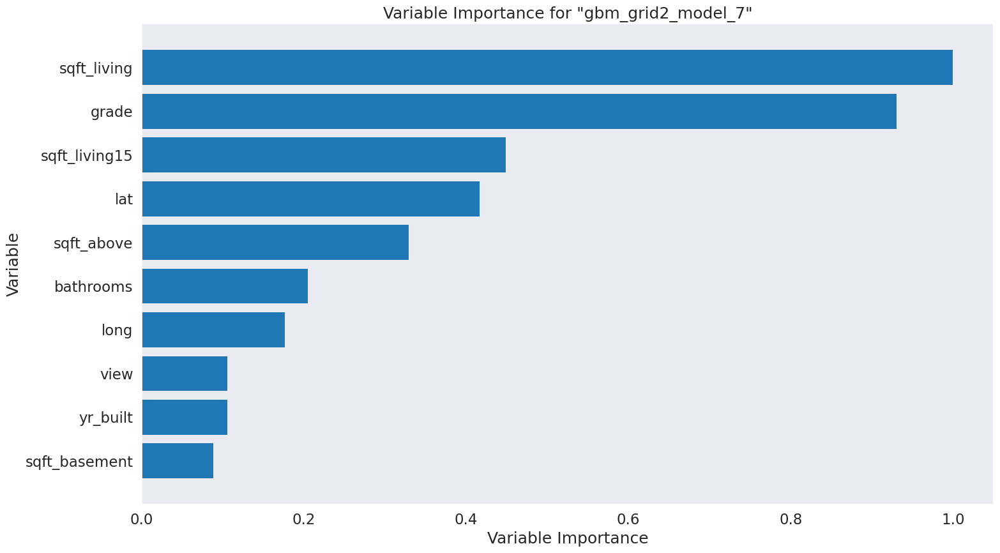

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

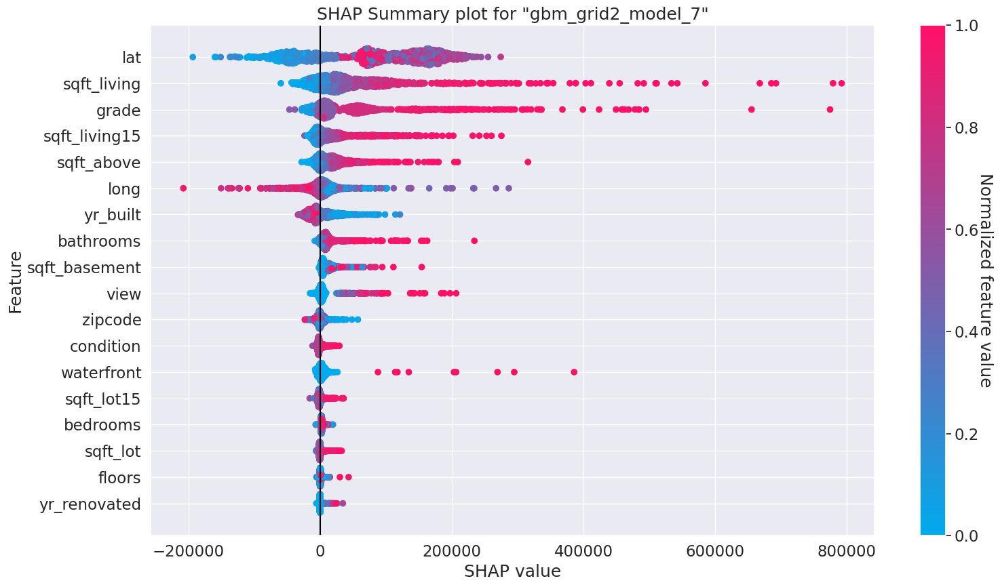

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

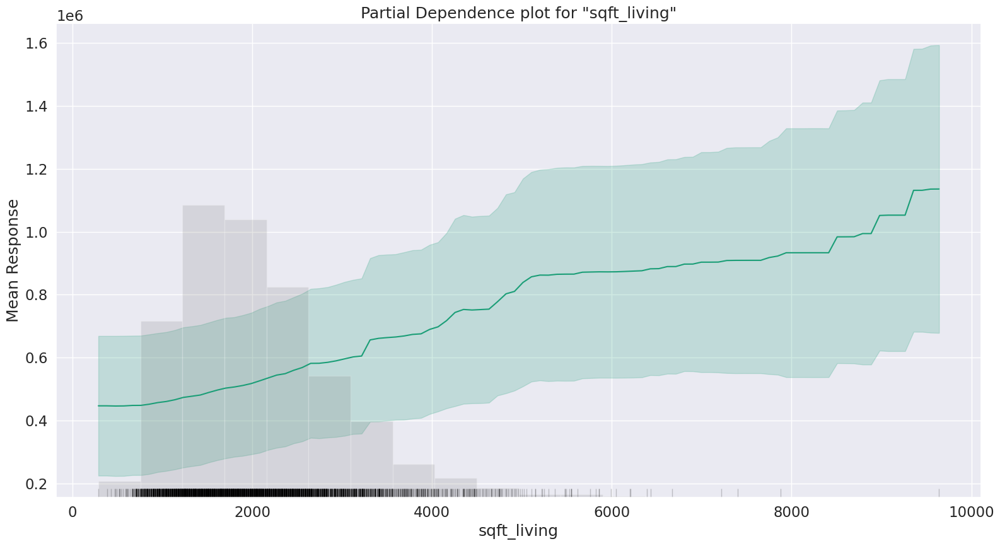

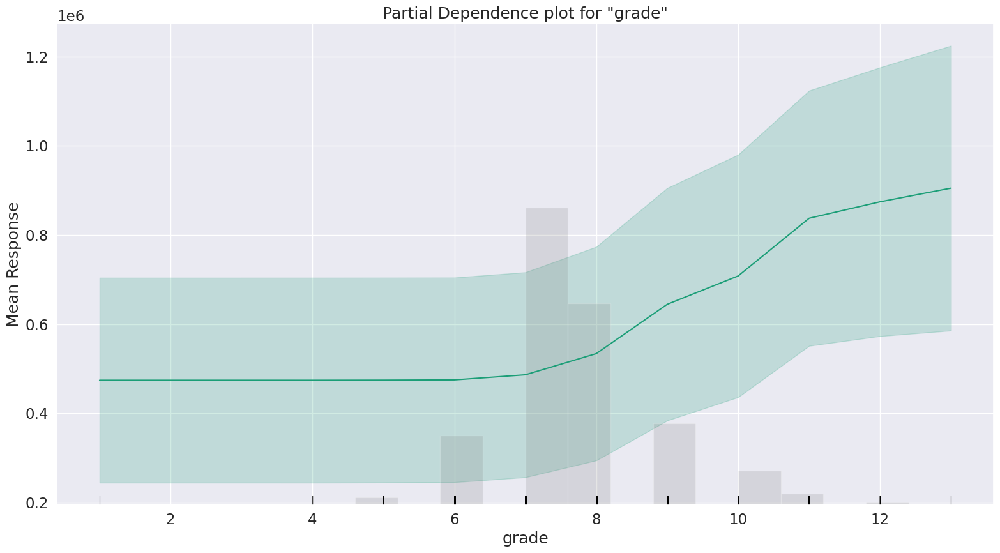

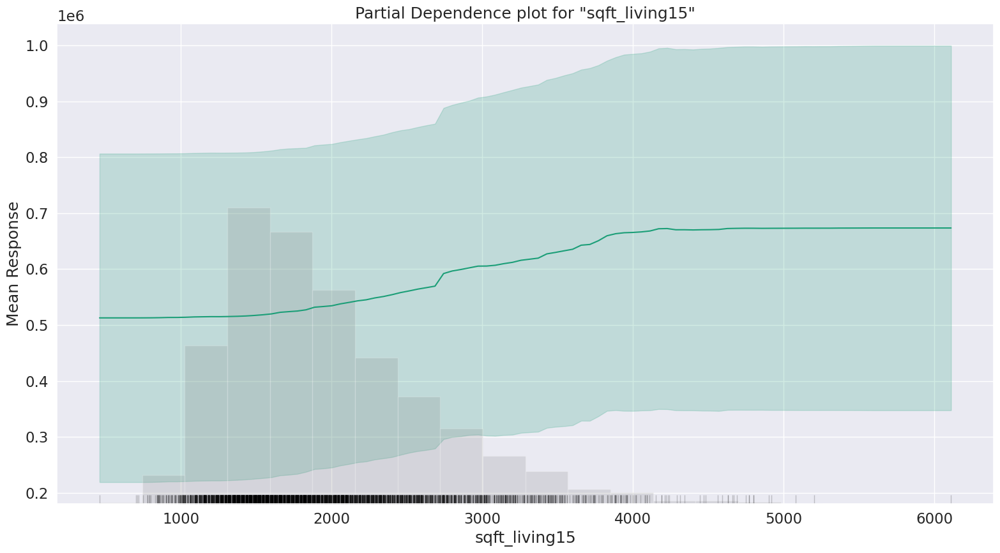

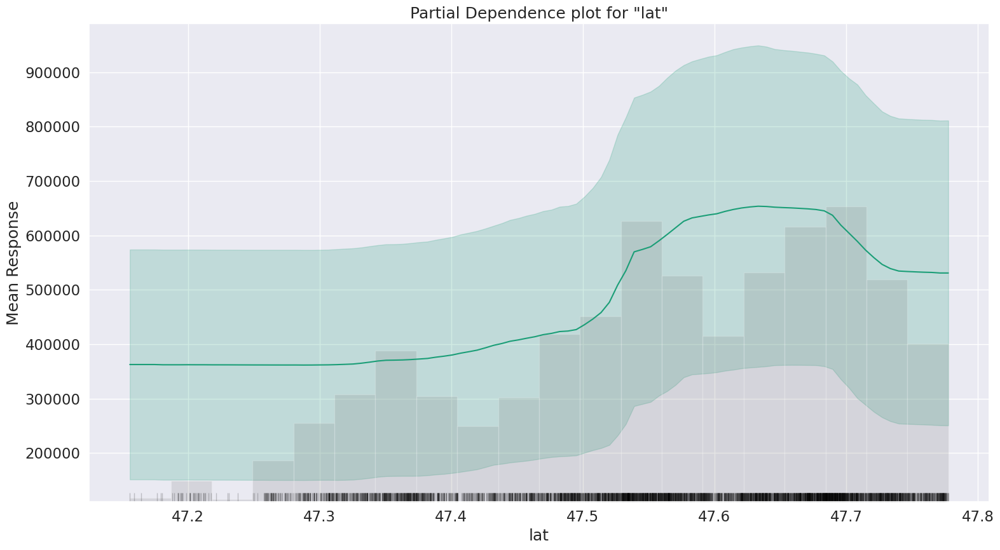

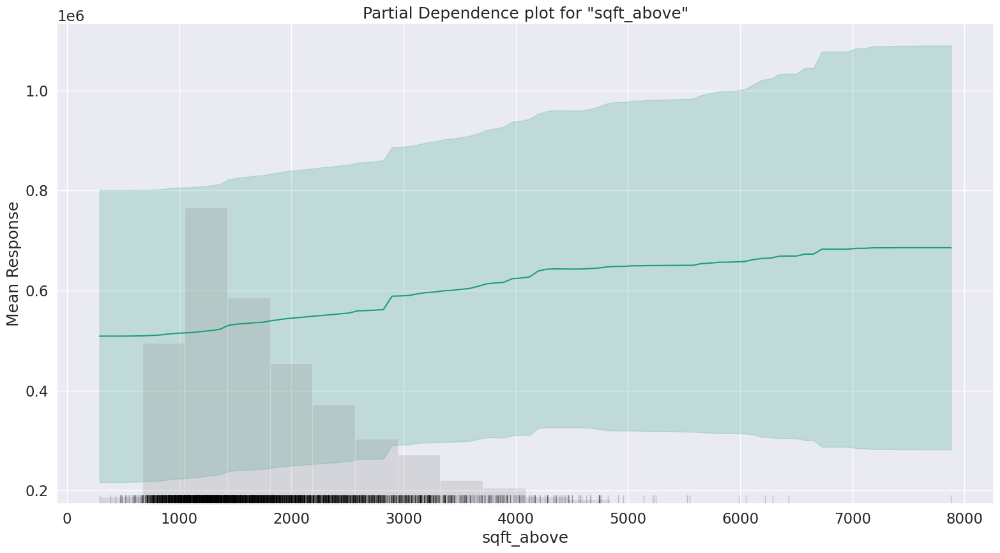

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

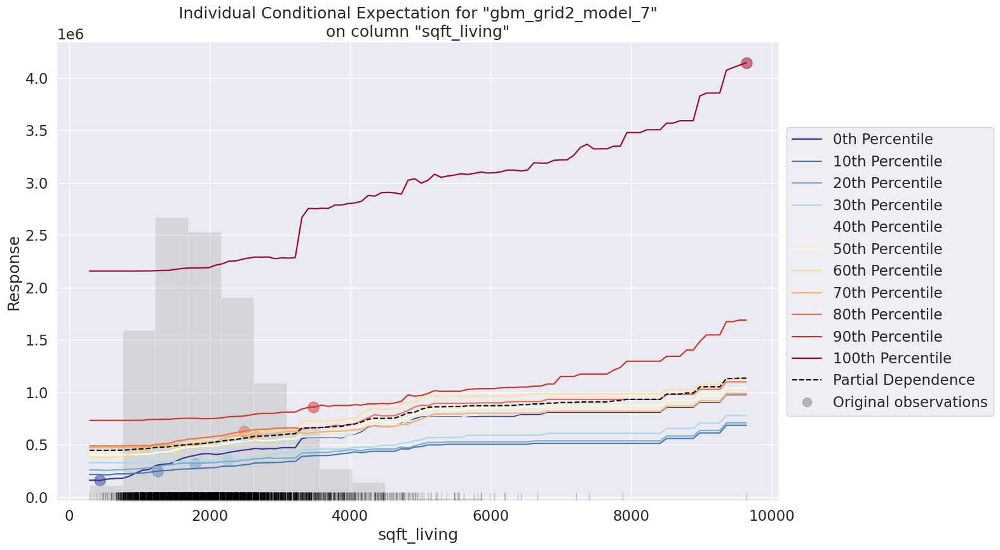

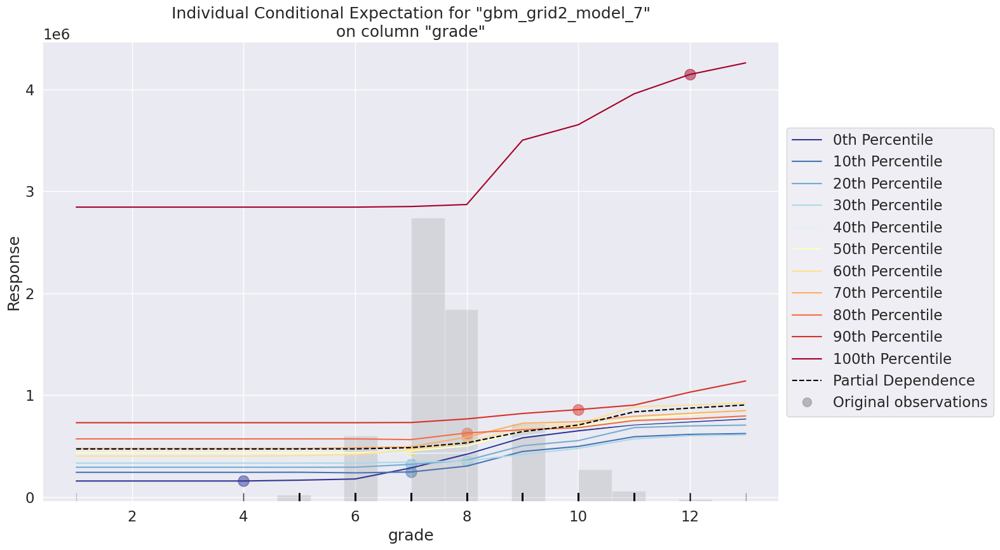

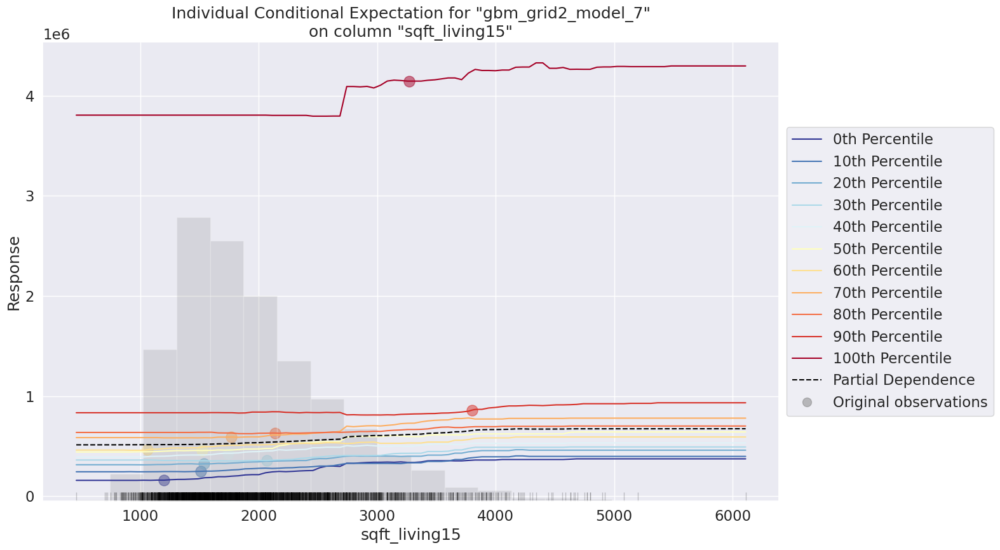

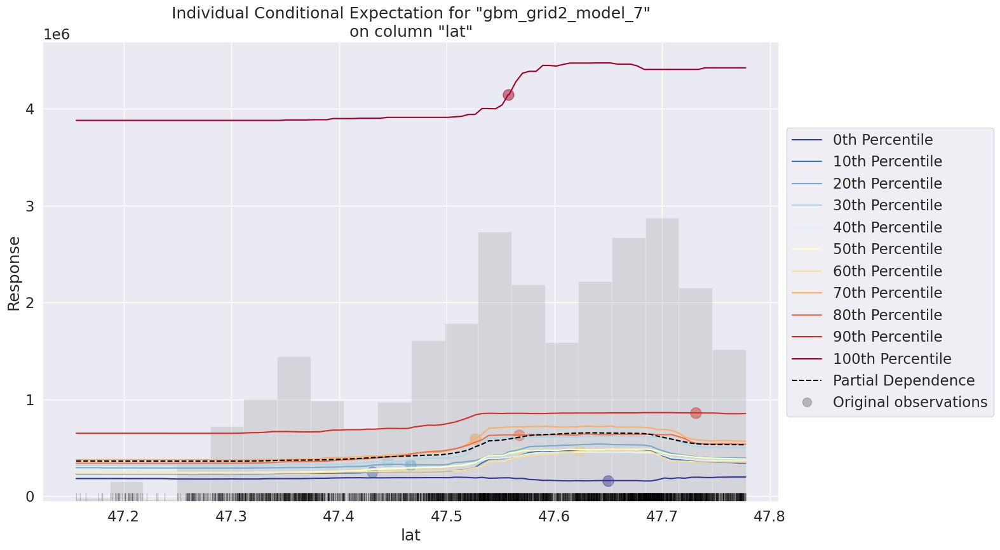

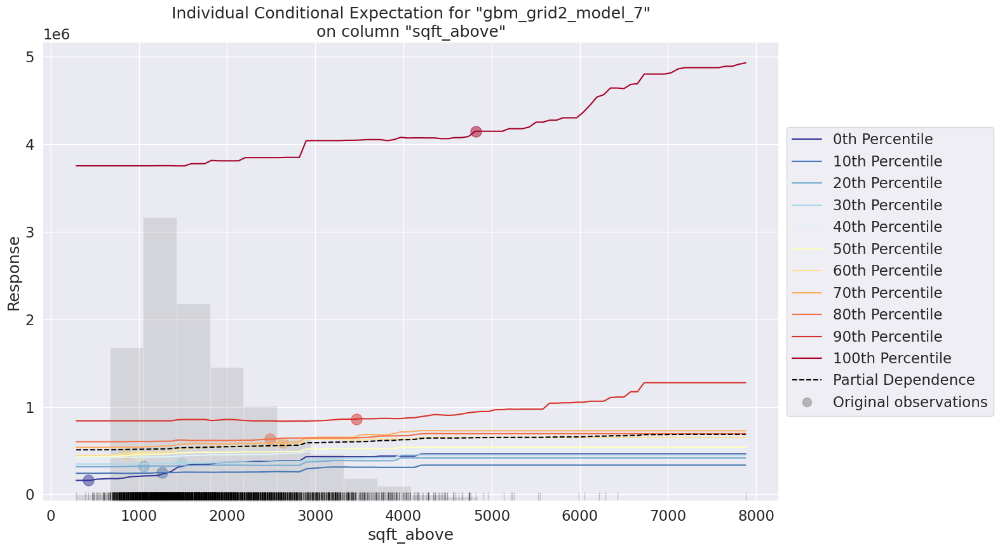

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [108]:
best_drf_model.explain(df_test)

## **Final Takeaways**

The Decision Tree Regressor is the best model for this task as it has the highest accuracy compared to the other models tested in this excercise. Also, this model is interpretible i.e. we can actually get to the root of what made this prediction to come to.

### **Learning Outcomes**


I gained knowledge about the complete process of a Data Science project, from data preparation to hyperparameter tuning. It is crucial to allocate a significant amount of time towards data preparation, which involves tasks such as cleaning, normalization, feature selection, and imputation. Although often neglected, hyperparameter tuning is the second most important aspect after data preparation, and the outcomes are worth the investment of time. It is advisable to train multiple models and select the best one for deployment since some algorithms perform better than others for specific tasks. The most valuable lesson from this series of assignments is model interpretation, where techniques such as SHAP, LIME, and PDP make it easier to comprehend how a model arrived at a specific outcome. This process helps to demystify the "black box" of machine learning models.

# Reference

[1]https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Full_ML_Report/Wine-Quality-Analysis.ipynb

[2]https://www.kaggle.com/code/washingtongold/king-county-house-sales-analysis

[3]https://inria.github.io/scikit-learn-mooc/python_scripts/dev_features_importance.html

[4]https://www.geeksforgeeks.org/random-forest-regression-in-python/


[5]https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb

[6]https://www.sigmamagic.com/blogs/what-is-variance-inflation-factor/

[7]https://deepnote.com/@jayjburgess/BigMart-Sales-Analysis-a3feccc6-e63d-4c9d-99ac-93f70845f92a

[8]https://www.kaggle.com/datasets/harlfoxem/housesalesprediction/discussion/207885

[9] https://www.kaggle.com/code/dasmehdixtr/no-show-prediction-best-score-96?kernelSessionId=81656383

[10] https://www.kaggle.com/code/brenoarosa/appointment-no-show-analysis-and-prediction

# LICENSE
LICENSE

Copyright <2022> Sonali Mondal

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.